
# Import packages and import data (do not change this)

In [51]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, confusion_matrix, matthews_corrcoef, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

# Read the dataset from CSV
data = pd.read_csv('Synapse.csv')


# Function to plot the confusion matrix (do not change this)

In [52]:

def plot_confusion_matrix(cm, classifier_name):
    sns.heatmap(cm, annot=True, fmt='d')
    plt.title(f'Confusion Matrix for {classifier_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

# Function to plot the correlation matrix (do not change this)

In [53]:

def plot_correlation_matrix(data):
    correlation_matrix = data.corr()
    sns.heatmap(correlation_matrix, annot=True)
    plt.title('Feature Correlation Matrix')
    plt.show()


# Function to plot the correlation between features and the response variable (do not change this)

In [54]:

def plot_feature_response_correlation(data, response):
    correlation_matrix = data.corr()[response].sort_values(ascending=False)
    # Drop the response variable to avoid a self-correlation of 1
    correlation_matrix = correlation_matrix.drop(response, axis=0)
    
    sns.barplot(x=correlation_matrix.index, y=correlation_matrix.values)
    plt.title(f'Correlation with {response} Variable')
    plt.xlabel('Feature')
    plt.ylabel('Correlation coefficient')
    plt.xticks(rotation=90)  # Rotate the feature names for better readability
    plt.show()

# Define the feature set and the target variable (do not change this)

In [55]:
# Here we are asking to drop the featuers named "File" becuase its a text and not useful, and the label Bug because we can not have it amongs the features.
X = data.drop(['File', 'BUG'], axis=1)
# Here we are asking y to be the target variable, what we are trying to predict/ classify.
y = data['BUG']
x_bug = data.drop(['File'], axis=1)


# Here you get to choose which features to include. After runninng the entire code at least once, you can select which fetueres to be included to answer HW2 questions. 

In [56]:
# Split the dataset into training and test sets (you can adjust the size of test set here)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


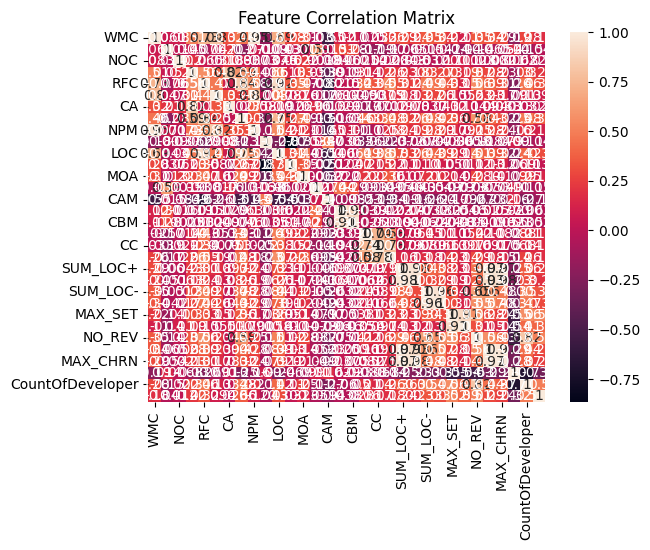

In [57]:
# Plot the correlation matrix for the features only in the dataset 
plot_correlation_matrix(X)

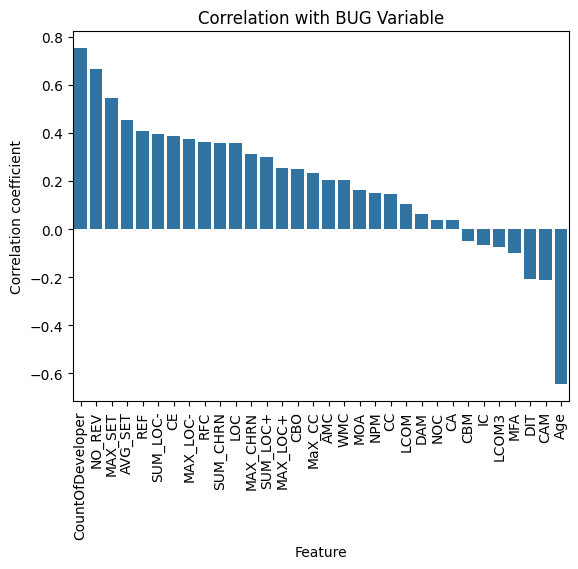

In [58]:

# Add the target variable back for correlation calculation (do not change this)
data_for_correlation = X.copy()
data_for_correlation['BUG'] = y

# Plot the correlation matrix for features and the BUG variable (do not change this)
plot_feature_response_correlation(data_for_correlation, 'BUG')
data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAkIAAAI5CAYAAABNQlUCAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjkuMiwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8hTgPZAAAACXBIWXMAAA9hAAAPYQGoP6dpAACQXElEQVR4nOzdd1gU1/s28HuX3rEgRRHsir1Hjb2BvcaWiKLYYu8liiX2hjVGBUtsxK7RmK+KIMbee29YwIIURUHgvH/4sj9XdpetlOz9ua69LnfOnJln1mX32ZlznpEIIQSIiIiIjJA0uwMgIiIiyi5MhIiIiMhoMREiIiIio8VEiIiIiIwWEyEiIiIyWkyEiIiIyGgxESIiIiKjxUSIiIiIjBYTISIiIjJaTISI/kPWr18PiUSCx48f622bjx8/hkQiwfr16/W2TUOTSCSYOnWq2usOHjzYsAEZkbCwMEgkEoSFhWnct1evXrC1tVVrXU3+j4lUYSJElIkHDx6gf//+KFq0KCwtLWFvb486depgyZIl+PjxY3aHpzdbtmxBYGBgdodhECdPnsTUqVMRGxur1+2mJ4lfP+zt7VGpUiUsX74cqampcut7enqiVatWCrd1/vx5pQnn1atX0bt3bxQpUgSWlpawtbVFpUqVMHbsWDx8+FBljG3atIG1tTUSEhKUrtOjRw+Ym5vj7du3mR800X+MaXYHQJSTHThwAJ07d4aFhQV69uyJcuXKITk5GSdOnMCYMWNw48YNrF69OrvD1IstW7bg+vXrGD58uNxyDw8PfPz4EWZmZtkTmBY+fvwIU9P/+3g7efIkpk2bhl69esHR0VHv++vWrRtatGgBAIiLi8PBgwcxZMgQPHnyBPPnz9dp22vWrMHAgQORP39+9OjRA6VLl0ZKSgquX7+OjRs3IjAwEB8/foSJiYnC/j169MD+/fuxe/du9OzZM0N7YmIi9u7dC29vb+TLl0+nWAGgXr16+PjxI8zNzXXeFlFWYCJEpMSjR4/QtWtXeHh4IDQ0FK6urrK2n3/+Gffv38eBAwd03o8QAp8+fYKVlVWGtk+fPsHc3BxSafadvJVIJLC0tMy2/Wsjq+OtUqUKfvzxR9nzQYMGoWbNmtiyZYtOidDJkycxcOBA1KlTB3/99Rfs7Ozk2hcuXIiZM2eq3EabNm1gZ2eHLVu2KEyE9u7diw8fPqBHjx5axwnIv1dz2/uFjBsvjREpMW/ePLx//x5BQUFySVC64sWLY9iwYbLnKSkpmDFjBooVKwYLCwt4enpi4sSJSEpKkuuXfnnkn3/+QbVq1WBlZYXff/9dNrZi27Zt+OWXX1CwYEFYW1sjPj4eAHDmzBl4e3vDwcEB1tbWqF+/Pv79999Mj2Pv3r1o2bIl3NzcYGFhgWLFimHGjBlyl20aNGiAAwcO4MmTJ7JLPJ6engCUjxEKDQ1F3bp1YWNjA0dHR7Rt2xa3bt2SW2fq1KmQSCS4f/++7GyMg4MDevfujcTERJVxL126FCYmJnKXsxYuXAiJRIKRI0fKlqWmpsLOzg7jxo2TLft6/MjUqVMxZswYAECRIkVkx/ftOKo9e/agXLlysLCwQNmyZXHo0CGV8akikUjg7Owsd1ZKG9OmTYNEIsHmzZszJEHAl4RvxowZSs8GAYCVlRU6dOiAo0eP4tWrVxnat2zZAjs7O7Rp0wYxMTEYPXo0ypcvD1tbW9jb28PHxwdXrlyR66PqvapojFBERAQ6d+6MwoULw8LCAu7u7hgxYoTSS8sPHz5E8+bNYWNjAzc3N0yfPh1CiExfr+fPn8PPzw/Ozs6y/8fg4OBM+5Fx4xkhIiX279+PokWLonbt2mqt37dvX2zYsAGdOnXCqFGjcObMGcyePRu3bt3C7t275da9c+cOunXrhv79+8Pf3x+lSpWStc2YMQPm5uYYPXo0kpKSYG5ujtDQUPj4+KBq1aoICAiAVCrFunXr0KhRI0RERKBGjRpK41q/fj1sbW0xcuRI2NraIjQ0FFOmTEF8fLzsbMWkSZMQFxeHZ8+eYfHixQCgctDqkSNH4OPjg6JFi2Lq1Kn4+PEjli1bhjp16uDixYuyJCrdDz/8gCJFimD27Nm4ePEi1q5diwIFCmDu3LlK91G3bl2kpaXhxIkTsnE1ERERkEqliIiIkK136dIlvH//HvXq1VO4nQ4dOuDu3bvYunUrFi9ejPz58wMAnJycZOucOHECu3btwqBBg2BnZ4elS5eiY8eOePr0qVqXixITE/HmzRsAQHx8PP7++28cOnQIEyZMyLSvqm2GhoaiQYMGKFSokNbbAb5cHtuwYQP+/PNPuYHhMTEx+Oeff9CtWzdYWVnhxo0b2LNnDzp37owiRYogOjoav//+O+rXr4+bN2/Czc1NbruK3quKbN++HYmJiRg4cCDy5cuHs2fPYtmyZXj27Bm2b98ut25qaiq8vb3x3XffYd68eTh06BACAgKQkpKC6dOnKz3G6OhofPfdd7LB705OTvj777/Rp08fxMfHZ7jkSyQjiCiDuLg4AUC0bdtWrfUvX74sAIi+ffvKLR89erQAIEJDQ2XLPDw8BABx6NAhuXWPHTsmAIiiRYuKxMRE2fK0tDRRokQJ0bx5c5GWliZbnpiYKIoUKSKaNm0qW7Zu3ToBQDx69EhuvW/1799fWFtbi0+fPsmWtWzZUnh4eGRY99GjRwKAWLdunWxZpUqVRIECBcTbt29ly65cuSKkUqno2bOnbFlAQIAAIPz8/OS22b59e5EvX74M+/paamqqsLe3F2PHjpW9Dvny5ROdO3cWJiYmIiEhQQghxKJFi4RUKhXv3r2T9QUgAgICZM/nz5+f4XX5el1zc3Nx//59uWMBIJYtW6YyxvTXRtFj4MCBcv9fQnz5v2/ZsqXCbZ07d07udU6PYfjw4RnWffv2rXj9+rXskZSUpDLOlJQU4erqKmrVqiW3fNWqVQKA+Oeff4QQQnz69EmkpqZmOEYLCwsxffp02TJl79Wv244dOyZbpug9OHv2bCGRSMSTJ09ky3x9fQUAMWTIENmytLQ00bJlS2Fubi5ev34tW/7t/3GfPn2Eq6urePPmjdx+unbtKhwcHBTGQCSEELw0RqRA+uUoRZcjFDl48CAAyF2yAYBRo0YBQIaxREWKFEHz5s0VbsvX11duvNDly5dx7949dO/eHW/fvsWbN2/w5s0bfPjwAY0bN8bx48eRlpamNLavt5WQkIA3b96gbt26SExMxO3bt9U6vq+9fPkSly9fRq9evZA3b17Z8goVKqBp06ay1+JrAwYMkHtet25dvH37VvY6KyKVSlG7dm0cP34cAHDr1i28ffsW48ePhxACp06dAvDlLFG5cuV0GgTdpEkTFCtWTO5Y7O3tM52Rla5fv344fPgwDh8+jJ07d+Lnn3/G77//nuH9oIn010bRmbmiRYvCyclJ9ti3b5/KbZmYmKBr1644deqU3CXBLVu2wNnZGY0bNwYAWFhYyMajpaam4u3bt7C1tUWpUqVw8eLFDNv99r2qzNfrfPjwAW/evEHt2rUhhMClS5cyrP/1Wav0MzzJyck4cuSIwu0LIbBz5060bt0aQgjZ38ibN2/QvHlzxMXFKYyfCOAYISKF7O3tAUDllOOvPXnyBFKpFMWLF5db7uLiAkdHRzx58kRueZEiRZRu69u2e/fuAfjypfP1l5+TkxPWrl2LpKQkxMXFKd3ejRs30L59ezg4OMDe3h5OTk6ygb2q+imTfixfX85LV6ZMGVmS9rXChQvLPc+TJw8A4N27dyr3VbduXVy4cAEfP35EREQEXF1dUaVKFVSsWFF2eezEiROoW7euxsehKr70GDOLL12JEiXQpEkTNGnSBB06dMDy5csxaNAgBAYG4tq1axrFIpFIAPxfEv7+/fsM6+zduxeHDx/GggUL1N5u+mDoLVu2AACePXuGiIgIdO3aVTbGKC0tDYsXL0aJEiVgYWGB/Pnzw8nJCVevXlX4XlH1Pv7a06dPZYmzra0tnJycUL9+fQAZ34NSqRRFixaVW1ayZEkAUFof6/Xr14iNjcXq1asz/I307t0bABSOjyICOEaISCF7e3u4ubnh+vXrGvVL/xLLjKpf0d+2pZ/tmT9/PipVqqSwj7LxPLGxsahfvz7s7e0xffp0FCtWDJaWlrh48SLGjRun8kySPikbzCsyGQD7/fff4/Pnzzh16hQiIiJkCU/dunURERGB27dv4/Xr1zonQtrGp0rjxo2xfPlyHD9+HOXLlwfwZXCzsgHC6YPH02dcFS9eHKampgrfg+lJhCaDsatWrYrSpUtj69atmDhxIrZu3QohhNxssVmzZmHy5Mnw8/PDjBkzkDdvXkilUgwfPlzhe0Wds0Gpqalo2rQpYmJiMG7cOJQuXRo2NjZ4/vw5evXqpZf3YPo2fvzxR/j6+ipcp0KFCjrvh/6bmAgRKdGqVSusXr0ap06dQq1atVSu6+HhgbS0NNy7dw9lypSRLY+OjkZsbCw8PDy0jiP9ko29vT2aNGmiUd+wsDC8ffsWu3btkhtM/OjRowzrqpvEpR/LnTt3MrTdvn0b+fPnh42NjUZxKlOjRg2Ym5sjIiICERERstlf9erVw5o1a3D06FHZc1XUPTZ9SklJASB/RsfDwwM3b95UuH7665n++trY2KBBgwYIDw/H8+fPUbBgQZ1j6tGjByZPnoyrV69iy5YtKFGiBKpXry5r37FjBxo2bIigoCC5frGxsbJB5pq6du0a7t69iw0bNshN3z98+LDC9dPS0vDw4UPZWSAAuHv3LgBkGISfzsnJCXZ2dkhNTdX4b4SIl8aIlBg7dixsbGzQt29fREdHZ2h/8OABlixZAgCyYnrfVmZetGgRAKBly5Zax1G1alUUK1YMCxYsUHiZ5PXr10r7pp/p+PrMRnJyMlauXJlhXRsbG7Uulbm6uqJSpUrYsGGD3NT269ev43//+5/stdAHS0tLVK9eHVu3bsXTp0/lzgh9/PgRS5cuRbFixRSWN/haemKm78rSquzfvx8AULFiRdmyFi1a4NmzZ9izZ4/cuklJSbKZdFWqVJEtnzJlClJTU/Hjjz8q/L/X9IxV+tmfKVOm4PLlyxlqB5mYmGTY5vbt2/H8+XON9vPtNr+NVQgh+9tRZPny5XLrLl++HGZmZrKxTIr20bFjR+zcuVPhGTRVfyNEPCNEpESxYsWwZcsWdOnSBWXKlJGrLH3y5Els374dvXr1AvDly87X1xerV6+WXY46e/YsNmzYgHbt2qFhw4ZaxyGVSrF27Vr4+PigbNmy6N27NwoWLIjnz5/j2LFjsLe3l33pfqt27drIkycPfH19MXToUEgkEvzxxx8Kv0CrVq2KkJAQjBw5EtWrV4etrS1at26tcLvz58+Hj48PatWqhT59+simzzs4OOj9/k9169bFnDlz4ODgILvEVKBAAZQqVQp37tyR/R+oUrVqVQBfygR07doVZmZmaN26td7OXF28eBGbNm0C8GVc2dGjR7Fz507Url0bzZo1k63Xr18/BAcHo3PnzvDz80PlypXx9u1bhISEyCpFfz0FvW7duli+fDmGDBmCEiVKyCpLJycn4+7du9i8eTPMzc3h4uKiVpxFihRB7dq1sXfvXgDIkAi1atUK06dPR+/evVG7dm1cu3YNmzdvzjBmRxOlS5dGsWLFMHr0aDx//hz29vbYuXOn0vFXlpaWOHToEHx9fVGzZk38/fffOHDgACZOnChX8uBbc+bMwbFjx1CzZk34+/vDy8sLMTExuHjxIo4cOYKYmBitj4H+47JjqhpRbnL37l3h7+8vPD09hbm5ubCzsxN16tQRy5Ytk5t+/vnzZzFt2jRRpEgRYWZmJtzd3cWECRPk1hFC+RTq9GnH27dvVxjHpUuXRIcOHUS+fPmEhYWF8PDwED/88IM4evSobB1F0+f//fdf8d133wkrKyvh5uYmxo4dK/75558MU5zfv38vunfvLhwdHQUA2VR6RdPnhRDiyJEjok6dOsLKykrY29uL1q1bi5s3b8qtkz59/utpz8riVObAgQMCgPDx8ZFb3rdvXwFABAUFZeiDb6ZWCyHEjBkzRMGCBYVUKpXbNwDx888/Z9iGh4eH8PX1VRmbounzpqamomjRomLMmDGyKf5fe/funRgxYoTsfWJvby8aNmwo/v77b6X7uXTpkujZs6coXLiwMDc3FzY2NqJChQpi1KhRctP+1bFixQoBQNSoUSND26dPn8SoUaOEq6ursLKyEnXq1BGnTp0S9evXF/Xr15etp+q9qmj6/M2bN0WTJk2Era2tyJ8/v/D395eVB/j6feXr6ytsbGzEgwcPRLNmzYS1tbVwdnYWAQEBGab1K/o/jo6OFj///LNwd3cXZmZmwsXFRTRu3FisXr1ao9eIjItECB1GAxIRERHlYhwjREREREaLiRAREREZLSZCREREZLSYCBEREZHRYiJERERERot1hDKRlpaGFy9ewM7OLluq0xIREZHmhBBISEiAm5ub7GbCijARysSLFy/g7u6e3WEQERGRFiIjI1GoUCGl7UyEMpF+B+jIyEjZHcmJiIgoZ4uPj4e7u7vse1yZXJcIrVixAvPnz0dUVBQqVqyIZcuWoUaNGkrXDwwMxG+//YanT58if/786NSpE2bPni27w3Nm0i+H2dvbMxEiIiLKZTIb1pKrBkun3wcpICAAFy9eRMWKFdG8eXO8evVK4fpbtmzB+PHjERAQgFu3biEoKAghISGYOHFiFkdOREREOVGuSoQWLVoEf39/9O7dG15eXli1ahWsra0RHByscP2TJ0+iTp066N69Ozw9PdGsWTN069YNZ8+ezeLIiYiIKCfKNYlQcnIyLly4gCZNmsiWSaVSNGnSBKdOnVLYp3bt2rhw4YIs8Xn48CEOHjyIFi1aKN1PUlIS4uPj5R5ERET035Rrxgi9efMGqampcHZ2llvu7OyM27dvK+zTvXt3vHnzBt9//z2EEEhJScGAAQNUXhqbPXs2pk2bptfYiYiIKGfKNWeEtBEWFoZZs2Zh5cqVuHjxInbt2oUDBw5gxowZSvtMmDABcXFxskdkZGQWRkxERERZKdecEcqfPz9MTEwQHR0ttzw6OhouLi4K+0yePBk//fQT+vbtCwAoX748Pnz4gH79+mHSpEkKCyxZWFjAwsJC/wdAREREOU6uOSNkbm6OqlWr4ujRo7JlaWlpOHr0KGrVqqWwT2JiYoZkx8TEBMCXipNERERk3HLNGSEAGDlyJHx9fVGtWjXUqFEDgYGB+PDhA3r37g0A6NmzJwoWLIjZs2cDAFq3bo1FixahcuXKqFmzJu7fv4/JkyejdevWsoSIiIiIjFeuSoS6dOmC169fY8qUKYiKikKlSpVw6NAh2QDqp0+fyp0B+uWXXyCRSPDLL7/g+fPncHJyQuvWrTFz5szsOgQiIiLKQSSC14hUio+Ph4ODA+Li4lhZmoiIKJdQ9/s714wRIiIiItI3JkJERERktJgIERERkdFiIkRERERGK1fNGstO9X7ZChMLK436XJjf00DREBERkT7wjBAREREZLSZCREREZLSYCBEREZHRYiJERERERouJEBERERktJkJERERktJgIERERkdFiIkRERERGi4kQERERGS0mQkRERGS0mAgRERGR0WIiREREREaLiRAREREZLSZCREREZLSYCBEREZHRYiJERERERouJEBERERktJkJERERktJgIERERkdFiIkRERERGyzS7AzAWVcds1Gj9C/N7GigSIiIiSsczQkRERGS0mAgRERGR0WIiREREREaLiRAREREZLSZCREREZLSYCBEREZHRYiJERERERouJEBERERktJkJERERktJgIERERkdFiIkRERERGK9clQitWrICnpycsLS1Rs2ZNnD17VuX6sbGx+Pnnn+Hq6goLCwuULFkSBw8ezKJoiYiIKCfLVTddDQkJwciRI7Fq1SrUrFkTgYGBaN68Oe7cuYMCBQpkWD85ORlNmzZFgQIFsGPHDhQsWBBPnjyBo6Nj1gdPREREOU6uSoQWLVoEf39/9O7dGwCwatUqHDhwAMHBwRg/fnyG9YODgxETE4OTJ0/CzMwMAODp6ZmVIRMREVEOlmsujSUnJ+PChQto0qSJbJlUKkWTJk1w6tQphX327duHWrVq4eeff4azszPKlSuHWbNmITU1Vel+kpKSEB8fL/cgIiKi/6Zckwi9efMGqampcHZ2llvu7OyMqKgohX0ePnyIHTt2IDU1FQcPHsTkyZOxcOFC/Prrr0r3M3v2bDg4OMge7u7uej0OIiIiyjlyTSKkjbS0NBQoUACrV69G1apV0aVLF0yaNAmrVq1S2mfChAmIi4uTPSIjI7MwYiIiIspKuWaMUP78+WFiYoLo6Gi55dHR0XBxcVHYx9XVFWZmZjAxMZEtK1OmDKKiopCcnAxzc/MMfSwsLGBhYaHf4ImIiChHyjVnhMzNzVG1alUcPXpUtiwtLQ1Hjx5FrVq1FPapU6cO7t+/j7S0NNmyu3fvwtXVVWESRERERMYl1yRCADBy5EisWbMGGzZswK1btzBw4EB8+PBBNousZ8+emDBhgmz9gQMHIiYmBsOGDcPdu3dx4MABzJo1Cz///HN2HQIRERHlILnm0hgAdOnSBa9fv8aUKVMQFRWFSpUq4dChQ7IB1E+fPoVU+n+5nbu7O/755x+MGDECFSpUQMGCBTFs2DCMGzcuuw6BiIiIcpBclQgBwODBgzF48GCFbWFhYRmW1apVC6dPnzZwVERERJQb5apLY0RERET6xESIiIiIjBYTISIiIjJaTISIiIjIaDERIiIiIqPFRIiIiIiMVq6bPm+Mqo7ZqHGfC/N7GiASIiKi/xaeESIiIiKjxUSIiIiIjBYTISIiIjJaTISIiIjIaDERIiIiIqPFRIiIiIiMFhMhIiIiMlpMhIiIiMhoMREiIiIio8VEiIiIiIwWEyEiIiIyWkyEiIiIyGgxESIiIiKjxUSIiIiIjBYTISIiIjJaTISIiIjIaDERIiIiIqPFRIiIiIiMFhMhIiIiMlpMhIiIiMhoMREiIiIio2Wa3QGQ4VUds1Gj9S/M72mgSIiIiHIWnhEiIiIio8VEiIiIiIwWEyEiIiIyWkyEiIiIyGgxESIiIiKjxUSIiIiIjBYTISIiIjJaTISIiIjIaOW6RGjFihXw9PSEpaUlatasibNnz6rVb9u2bZBIJGjXrp1hAyQiIqJcI1clQiEhIRg5ciQCAgJw8eJFVKxYEc2bN8erV69U9nv8+DFGjx6NunXrZlGkRERElBvkqltsLFq0CP7+/ujduzcAYNWqVThw4ACCg4Mxfvx4hX1SU1PRo0cPTJs2DREREYiNjc3CiHM/TW/PAfAWHURElHvkmjNCycnJuHDhApo0aSJbJpVK0aRJE5w6dUppv+nTp6NAgQLo06ePWvtJSkpCfHy83IOIiIj+m3JNIvTmzRukpqbC2dlZbrmzszOioqIU9jlx4gSCgoKwZs0atfcze/ZsODg4yB7u7u46xU1EREQ5V666NKaJhIQE/PTTT1izZg3y58+vdr8JEyZg5MiRsufx8fFMhnSg6aU1XlYjIqKslGsSofz588PExATR0dFyy6Ojo+Hi4pJh/QcPHuDx48do3bq1bFlaWhoAwNTUFHfu3EGxYsUy9LOwsICFhYWeoyciIqKcKNckQubm5qhatSqOHj0qmwKflpaGo0ePYvDgwRnWL126NK5duya37JdffkFCQgKWLFnCszy5AAdqExGRoeWaRAgARo4cCV9fX1SrVg01atRAYGAgPnz4IJtF1rNnTxQsWBCzZ8+GpaUlypUrJ9ff0dERADIsJyIiIuOUqxKhLl264PXr15gyZQqioqJQqVIlHDp0SDaA+unTp5BKc834byIiIspmuSoRAoDBgwcrvBQGAGFhYSr7rl+/Xv8BUY7FgdpERJQZnj4hIiIio6VxIuTn54eEhIQMyz98+AA/Pz+9BEVERESUFTS+NLZhwwbMmTMHdnZ2css/fvyIjRs3Ijg4WG/BEWUXzlgjIjIOaidC8fHxEEJACIGEhARYWlrK2lJTU3Hw4EEUKFDAIEES5Ta6jE9iEkZElHXUToQcHR0hkUggkUhQsmTJDO0SiQTTpk3Ta3BEREREhqR2InTs2DEIIdCoUSPs3LkTefPmlbWZm5vDw8MDbm5uBgmSiIiIyBDUToTq168PAHj06BHc3d1Zr4eIiIhyPY0HS3t4eCA2NhZnz57Fq1evZPfvStezJ8cqEBERUe6gcSK0f/9+9OjRA+/fv4e9vT0kEomsTSKRMBEiIiKiXEPj61ujRo2Cn58f3r9/j9jYWLx79072iImJMUSMRERERAahcSL0/PlzDB06FNbW1oaIh4iIiCjLaJwINW/eHOfPnzdELERERERZSuMxQi1btsSYMWNw8+ZNlC9fHmZmZnLtbdq00VtwRERERIakcSLk7+8PAJg+fXqGNolEgtTUVN2jIiIiIsoCGidC306XJ6KcRZfbexARGRudqiJ++vRJX3EQERERZTmNE6HU1FTMmDEDBQsWhK2tLR4+fAgAmDx5MoKCgvQeIBEREZGhaHxpbObMmdiwYQPmzZsnGy8EAOXKlUNgYCD69Omj1wCJKOtoelkN4KU1IsrdND4jtHHjRqxevRo9evSAiYmJbHnFihVx+/ZtvQZHREREZEhaFVQsXrx4huVpaWn4/PmzXoIiIiIiygoaJ0JeXl6IiIjIsHzHjh2oXLmyXoIiIiIiygoajxGaMmUKfH198fz5c6SlpWHXrl24c+cONm7ciL/++ssQMRIREREZhMZnhNq2bYv9+/fjyJEjsLGxwZQpU3Dr1i3s378fTZs2NUSMRERERAah8RkhAKhbty4OHz6s71iIiIiIspROBRWJiIiIcjO1zgjlzZsXd+/eRf78+ZEnTx5IJBKl68bExOgtOCIiIiJDUisRWrx4Mezs7GT/VpUIEREREeUWaiVCvr6+sn/36tXLULEQERERZSmNB0sfPHgQJiYmaN68udzy//3vf0hNTYWPj4/egiOi3EXTW3Tw9hxElN00ToTGjx+POXPmZFielpaG8ePHMxEiIq3wPmdElB00njV27949eHl5ZVheunRp3L9/Xy9BEREREWUFjRMhBwcHPHz4MMPy+/fvw8bGRi9BEREREWUFrSpLDx8+HA8ePJAtu3//PkaNGoU2bdroNTgiIiIiQ9J4jNC8efPg7e2N0qVLo1ChQgCAZ8+eoW7duliwYIHeAyQiUgcHahORNjROhBwcHHDy5EkcPnwYV65cgZWVFSpUqIB69eoZIj4iIiIig9HqXmMSiQTNmjVDs2bN9B0PERERUZZRKxFaunQp+vXrB0tLSyxdulTlukOHDtVLYERERESGpvYtNnr06AFLS0ssXrxY6XoSicTgidCKFSswf/58REVFoWLFili2bBlq1KihcN01a9Zg48aNuH79OgCgatWqmDVrltL1iYiIyLiolQhdvnwZDg4OAIBHjx4ZNCBVQkJCMHLkSKxatQo1a9ZEYGAgmjdvjjt37qBAgQIZ1g8LC0O3bt1Qu3ZtWFpaYu7cuWjWrBlu3LiBggULZsMREBERUU6i1vT5vHnz4tWrVwCARo0aITY21pAxKbVo0SL4+/ujd+/e8PLywqpVq2BtbY3g4GCF62/evBmDBg1CpUqVULp0aaxduxZpaWk4evRoFkdOREREOZFaZ4RsbW3x9u1bFChQAGFhYfj8+bOh48ogOTkZFy5cwIQJE2TLpFIpmjRpglOnTqm1jcTERHz+/Bl58+ZVuk5SUhKSkpJkz+Pj47UPmohyBV1v78Gp+0S5l1qJUJMmTdCwYUOUKVMGANC+fXuYm5srXDc0NFR/0X3lzZs3SE1NhbOzs9xyZ2dn3L59W61tjBs3Dm5ubmjSpInSdWbPno1p06bpFCsRERHlDmolQps2bcKGDRvw4MEDhIeHo2zZsrC2tjZ0bHo1Z84cbNu2DWFhYbC0tFS63oQJEzBy5EjZ8/j4eLi7u2dFiERERJTF1EqEPn/+jAEDBgAAzp8/j7lz58LR0dGQcWWQP39+mJiYIDo6Wm55dHQ0XFxcVPZdsGAB5syZgyNHjqBChQoq17WwsICFhYXO8RIREVHOp9Zg6Tx58sgGS0skEoMGpIy5uTmqVq0qN9A5feBzrVq1lPabN28eZsyYgUOHDqFatWpZESoRERHlEmolQumDpQEgPDw8WwZLA8DIkSOxZs0abNiwAbdu3cLAgQPx4cMH9O7dGwDQs2dPucHUc+fOxeTJkxEcHAxPT09ERUUhKioK79+/z5b4iYiIKGfReLC0ECJbBksDQJcuXfD69WtMmTIFUVFRqFSpEg4dOiQbQP306VNIpf+X2/32229ITk5Gp06d5LYTEBCAqVOnGixOIiIiyh1y3WDpwYMHY/DgwQrbwsLC5J4/fvzY8AERERFRrqVWImRlZZXtg6WJiIiI9E2tMUJfO3bsGBwdHZGcnIw7d+4gJSXFEHERERERGZxaZ4S+9vHjRwwePBgbNmwAANy9exdFixbFkCFDULBgQYwfP17vQRIR/VfpWtWaiHSj8Rmh8ePH48qVKxkKEzZp0gQhISF6DY6IiIjIkDQ+I7Rnzx6EhITgu+++k6spVLZsWTx48ECvwREREREZksaJ0OvXr1GgQIEMyz98+JBtxRaJiIwVb/hKpBuNE6Fq1arhwIEDGDJkCID/qzS9du1alRWeiYgoZ+H4JCItEqFZs2bBx8cHN2/eREpKCpYsWYKbN2/i5MmTCA8PN0SMRERERAah8WDp77//HpcvX0ZKSgrKly+P//3vfyhQoABOnTqFqlWrGiJGIiIiIoPQ+IwQABQrVgxr1qzRdyxEREREWUqrRCg1NRV79uzBrVu3AHyZMdamTRuYmJjoNTgiIiIiQ9I4Ebp//z5atmyJZ8+eoVSpUgCA2bNnw93dHQcOHECxYsX0HiQRERGRIWg8Rmjo0KEoWrQoIiMjcfHiRVy8eBFPnz5FkSJFMHToUEPESERERGQQGp8RCg8Px+nTp5E3b17Zsnz58mHOnDmoU6eOXoMjIiIiMiSNzwhZWFggISEhw/L379/D3NxcL0ERERERZQWNE6FWrVqhX79+OHPmDIQQEELg9OnTGDBgANq0aWOIGImIiIgMQuNLY0uXLoWvry9q1aoFMzMzAEBKSgratGmDJUuW6D1AIiLKmXh7D/ov0DgRcnR0xN69e3H//n3Z9PkyZcqgePHieg+OiIiIyJC0qiMEAMWLF2fyQ0RERLmaxmOEOnbsiLlz52ZYPm/ePHTu3FkvQRERERFlBY0ToePHj6NFixYZlvv4+OD48eN6CYqIiIgoK2icCCmbJm9mZob4+Hi9BEVERESUFTROhMqXL4+QkJAMy7dt2wYvLy+9BEVERESUFTQeLD158mR06NABDx48QKNGjQAAR48exdatW7F9+3a9B0hERERkKBonQq1bt8aePXswa9Ys7NixA1ZWVqhQoQKOHDmC+vXrGyJGIiIiIoPQavp8y5Yt0bJlS33HQkRERJSltK4jREREpC1Nq1IDrExNhqHxYGkiIiKi/womQkRERGS0mAgRERGR0WIiREREREZL48HSqampWL9+PY4ePYpXr14hLS1Nrj00NFRvwREREREZksaJ0LBhw7B+/Xq0bNkS5cqVg0QiMURcRERESmk66+zrGWecsUZf0zgR2rZtG/7880+FN14lIiIiyk00HiNkbm6O4sWLGyIWIiIioiylcSI0atQoLFmyBEIIQ8RDRERElGU0vjR24sQJHDt2DH///TfKli0LMzMzufZdu3bpLTgiIiIiQ9I4EXJ0dET79u0NEQsRERFRltI4EVq3bp0h4lDbihUrMH/+fERFRaFixYpYtmwZatSooXT97du3Y/LkyXj8+DFKlCiBuXPncqA3ERERAdChoOLr169x4sQJnDhxAq9fv9ZnTEqFhIRg5MiRCAgIwMWLF1GxYkU0b94cr169Urj+yZMn0a1bN/Tp0weXLl1Cu3bt0K5dO1y/fj1L4iUiIqKcTeNE6MOHD/Dz84Orqyvq1auHevXqwc3NDX369EFiYqIhYpRZtGgR/P390bt3b3h5eWHVqlWwtrZGcHCwwvWXLFkCb29vjBkzBmXKlMGMGTNQpUoVLF++XOk+kpKSEB8fL/cgIiKi/yaJ0HD6V//+/XHkyBEsX74cderUAfBlAPXQoUPRtGlT/PbbbwYJNDk5GdbW1tixYwfatWsnW+7r64vY2Fjs3bs3Q5/ChQtj5MiRGD58uGxZQEAA9uzZgytXrijcz9SpUzFt2rQMy+Pi4mBvb6/zcRARUe6WncUcuW/1+8bHx8PBwSHT72+Nzwjt3LkTQUFB8PHxgb29Pezt7dGiRQusWbMGO3bs0HRzanvz5g1SU1Ph7Owst9zZ2RlRUVEK+0RFRWm0PgBMmDABcXFxskdkZKTuwRMREVGOpPFg6cTExAzJBQAUKFDA4JfGsoKFhQUsLCyyOwwiIiLKAhqfEapVqxYCAgLw6dMn2bKPHz9i2rRpqFWrll6D+1r+/PlhYmKC6OhoueXR0dFwcXFR2MfFxUWj9YmIiMi4aJwILVmyBP/++y8KFSqExo0bo3HjxnB3d8fJkyexZMkSQ8QI4MutPapWrYqjR4/KlqWlpeHo0aNKE7BatWrJrQ8Ahw8fNmjCRkRERLmHxpfGypUrh3v37mHz5s24ffs2AKBbt27o0aMHrKys9B7g10aOHAlfX19Uq1YNNWrUQGBgID58+IDevXsDAHr27ImCBQti9uzZAIBhw4ahfv36WLhwIVq2bIlt27bh/PnzWL16tUHjJCIiotxB40QIAKytreHv76/vWDLVpUsXvH79GlOmTEFUVBQqVaqEQ4cOycYsPX36FFLp/53kql27NrZs2YJffvkFEydORIkSJbBnzx6UK1cuy2MnIiKinEetRGjfvn3w8fGBmZkZ9u3bp3LdNm3a6CUwZQYPHozBgwcrbAsLC8uwrHPnzujcubNBYyIiIqLcSa1EqF27doiKikKBAgXkavh8SyKRIDU1VV+xERERERmUWolQWlqawn8TERER5WYazxrbuHEjkpKSMixPTk7Gxo2aV44kIiIiyi4aJ0K9e/dGXFxchuUJCQmy2VtEREREuYHGs8aEEJBIJBmWP3v2DA4ODnoJioiIKKf6+h5YlPupnQhVrlwZEokEEokEjRs3hqnp/3VNTU3Fo0eP4O3tbZAgiYiIiAxB7UQofbbY5cuX0bx5c9ja2srazM3N4enpiY4dO+o9QCIiIiJDUTsRCggIAAB4enqiS5cusLS0NFhQRERERFlB4zFCvr6+hoiDiIjoP4/ji3IejROh1NRULF68GH/++SeePn2K5ORkufaYmBi9BUdERERkSBonQtOmTcPatWsxatQo/PLLL5g0aRIeP36MPXv2YMqUKYaIkYiIiMAzSoagcR2hzZs3Y82aNRg1ahRMTU3RrVs3rF27FlOmTMHp06cNESMRERGRQWicCEVFRaF8+fIAAFtbW1lxxVatWuHAgQP6jY6IiIjIgDROhAoVKoSXL18CAIoVK4b//e9/AIBz587BwsJCv9ERERERGZDGiVD79u1x9OhRAMCQIUMwefJklChRAj179oSfn5/eAyQiIiIyFI0HS8+ZM0f27y5duqBw4cI4deoUSpQogdatW+s1OCIiIiJD0jgR+latWrVQq1YtfcRCREREBsIZZ4qplQjt27dP7Q22adNG62CIiIiIspJaiVD6fcYyI5FIkJqaqks8RERERFlGrUQoLS3N0HEQERERZTmNZ4197dOnT/qKg4iIiCjLaZwIpaamYsaMGShYsCBsbW3x8OFDAMDkyZMRFBSk9wCJiIiIDEXjRGjmzJlYv3495s2bB3Nzc9nycuXKYe3atXoNjoiIiMiQNE6ENm7ciNWrV6NHjx4wMTGRLa9YsSJu376t1+CIiIiIDEnjROj58+coXrx4huVpaWn4/PmzXoIiIiIiygoaJ0JeXl6IiIjIsHzHjh2oXLmyXoIiIiIiygoaV5aeMmUKfH198fz5c6SlpWHXrl24c+cONm7ciL/++ssQMRIREREZhMZnhNq2bYv9+/fjyJEjsLGxwZQpU3Dr1i3s378fTZs2NUSMRERERAah0RmhlJQUzJo1C35+fjh8+LChYiIiIiLKEhqdETI1NcW8efOQkpJiqHiIiIiIsozGl8YaN26M8PBwQ8RCRERElKU0Hizt4+OD8ePH49q1a6hatSpsbGzk2nn3eSIiIsotNE6EBg0aBABYtGhRhjbefZ6IiIhyE40TId6JnoiIiP4rNBoj9PnzZ5iamuL69euGioeIiIgoy2iUCJmZmaFw4cK8/EVERET/CRrPGps0aRImTpyImJgYQ8RDRERElGU0ToSWL1+O48ePw83NDaVKlUKVKlXkHoYSExODHj16wN7eHo6OjujTpw/ev3+vcv0hQ4agVKlSsLKyQuHChTF06FDExcUZLEYiIiLKXTQeLN2uXTsDhJG5Hj164OXLlzh8+DA+f/6M3r17o1+/ftiyZYvC9V+8eIEXL15gwYIF8PLywpMnTzBgwAC8ePECO3bsyOLoiYiIKCfSOBEKCAgwRBwq3bp1C4cOHcK5c+dQrVo1AMCyZcvQokULLFiwAG5ubhn6lCtXDjt37pQ9L1asGGbOnIkff/wRKSkpMDVVfOhJSUlISkqSPY+Pj9fz0RAREVFOofGlsXQXLlzApk2bsGnTJly6dEmfMWVw6tQpODo6ypIgAGjSpAmkUinOnDmj9nbi4uJgb2+vNAkCgNmzZ8PBwUH2cHd31yl2IiIiyrk0PiP06tUrdO3aFWFhYXB0dAQAxMbGomHDhti2bRucnJz0HSOioqJQoEABuWWmpqbImzcvoqKi1NrGmzdvMGPGDPTr10/lehMmTMDIkSNlz+Pj45kMERER/UdpnAgNGTIECQkJuHHjBsqUKQMAuHnzJnx9fTF06FBs3bpV7W2NHz8ec+fOVbnOrVu3NA0xg/j4eLRs2RJeXl6YOnWqynUtLCxgYWGh8z6JiIj+Sy7M75ndIRiExonQoUOHcOTIEVkSBABeXl5YsWIFmjVrptG2Ro0ahV69eqlcp2jRonBxccGrV6/klqekpCAmJgYuLi4q+yckJMDb2xt2dnbYvXs3zMzMNIqRiIiIdJOTkyitbrGhKJkwMzPT+PYbTk5Oal1Kq1WrFmJjY3HhwgVUrVoVABAaGoq0tDTUrFlTab/4+Hg0b94cFhYW2LdvHywtLTWKj4iIiP7bNB4s3ahRIwwbNgwvXryQLXv+/DlGjBiBxo0b6zW4dGXKlIG3tzf8/f1x9uxZ/Pvvvxg8eDC6du0qmzH2/PlzlC5dGmfPngXwJQlq1qwZPnz4gKCgIMTHxyMqKgpRUVGsjE1EREQAtDgjtHz5crRp0waenp6yQcSRkZEoV64cNm3apPcA023evBmDBw9G48aNIZVK0bFjRyxdulTW/vnzZ9y5cweJiYkAgIsXL8pmlBUvXlxuW48ePYKnp6fBYiUiIqLcQeNEyN3dHRcvXsSRI0dw+/ZtAF/O2DRp0kTvwX0tb968SosnAoCnpyeEELLnDRo0kHtORERE9C2NEyEAkEgkaNq0KZo2barveIiIiIiyjNpjhEJDQ+Hl5aWw0nJcXBzKli2LiIgIvQZHREREZEhqJ0KBgYHw9/eHvb19hjYHBwf0798fixYt0mtwRERERIakdiJ05coVeHt7K21v1qwZLly4oJegiIiIiLKC2olQdHS0ymKEpqameP36tV6CIiIiIsoKaidCBQsWxPXr15W2X716Fa6urnoJioiIiCgrqJ0ItWjRApMnT8anT58ytH38+BEBAQFo1aqVXoMjIiIiMiS1p8//8ssv2LVrF0qWLInBgwejVKlSAIDbt29jxYoVSE1NxaRJkwwWKBEREZG+qZ0IOTs74+TJkxg4cCAmTJggK1YokUjQvHlzrFixAs7OzgYLlIiIiEjfNCqo6OHhgYMHD+Ldu3e4f/8+hBAoUaIE8uTJY6j4iIiIiAxGq8rSefLkQfXq1fUdCxEREVGW0vju80RERET/FUyEiIiIyGgxESIiIiKjxUSIiIiIjBYTISIiIjJaTISIiIjIaDERIiIiIqPFRIiIiIiMFhMhIiIiMlpMhIiIiMhoMREiIiIio8VEiIiIiIwWEyEiIiIyWkyEiIiIyGgxESIiIiKjxUSIiIiIjBYTISIiIjJaTISIiIjIaDERIiIiIqPFRIiIiIiMFhMhIiIiMlpMhIiIiMhoMREiIiIio8VEiIiIiIwWEyEiIiIyWkyEiIiIyGjlmkQoJiYGPXr0gL29PRwdHdGnTx+8f/9erb5CCPj4+EAikWDPnj2GDZSIiIhyjVyTCPXo0QM3btzA4cOH8ddff+H48ePo16+fWn0DAwMhkUgMHCERERHlNqbZHYA6bt26hUOHDuHcuXOoVq0aAGDZsmVo0aIFFixYADc3N6V9L1++jIULF+L8+fNwdXXNdF9JSUlISkqSPY+Pj9f9AIiIiChHyhVnhE6dOgVHR0dZEgQATZo0gVQqxZkzZ5T2S0xMRPfu3bFixQq4uLiota/Zs2fDwcFB9nB3d9c5fiIiIsqZckUiFBUVhQIFCsgtMzU1Rd68eREVFaW034gRI1C7dm20bdtW7X1NmDABcXFxskdkZKTWcRMREVHOlq2J0Pjx4yGRSFQ+bt++rdW29+3bh9DQUAQGBmrUz8LCAvb29nIPIiIi+m/K1jFCo0aNQq9evVSuU7RoUbi4uODVq1dyy1NSUhATE6P0kldoaCgePHgAR0dHueUdO3ZE3bp1ERYWpkPkRERE9F+QrYmQk5MTnJycMl2vVq1aiI2NxYULF1C1alUAXxKdtLQ01KxZU2Gf8ePHo2/fvnLLypcvj8WLF6N169a6B09ERES5Xq6YNVamTBl4e3vD398fq1atwufPnzF48GB07dpVNmPs+fPnaNy4MTZu3IgaNWrAxcVF4dmiwoULo0iRIll9CERERJQD5YrB0gCwefNmlC5dGo0bN0aLFi3w/fffY/Xq1bL2z58/486dO0hMTMzGKImIiCg3yRVnhAAgb9682LJli9J2T09PCCFUbiOzdiIiIjIuueaMEBEREZG+MREiIiIio8VEiIiIiIwWEyEiIiIyWkyEiIiIyGgxESIiIiKjxUSIiIiIjBYTISIiIjJaTISIiIjIaDERIiIiIqPFRIiIiIiMFhMhIiIiMlpMhIiIiMhoMREiIiIio8VEiIiIiIwWEyEiIiIyWkyEiIiIyGgxESIiIiKjxUSIiIiIjBYTISIiIjJaTISIiIjIaDERIiIiIqPFRIiIiIiMFhMhIiIiMlpMhIiIiMhoMREiIiIio8VEiIiIiIwWEyEiIiIyWkyEiIiIyGgxESIiIiKjxUSIiIiIjBYTISIiIjJaTISIiIjIaDERIiIiIqPFRIiIiIiMFhMhIiIiMlpMhIiIiMho5ZpEKCYmBj169IC9vT0cHR3Rp08fvH//PtN+p06dQqNGjWBjYwN7e3vUq1cPHz9+zIKIiYiIKKfLNYlQjx49cOPGDRw+fBh//fUXjh8/jn79+qnsc+rUKXh7e6NZs2Y4e/Yszp07h8GDB0MqzTWHTURERAZkmt0BqOPWrVs4dOgQzp07h2rVqgEAli1bhhYtWmDBggVwc3NT2G/EiBEYOnQoxo8fL1tWqlQplftKSkpCUlKS7Hl8fLwejoCIiIhyolxxauTUqVNwdHSUJUEA0KRJE0ilUpw5c0Zhn1evXuHMmTMoUKAAateuDWdnZ9SvXx8nTpxQua/Zs2fDwcFB9nB3d9frsRAREVHOkSsSoaioKBQoUEBumampKfLmzYuoqCiFfR4+fAgAmDp1Kvz9/XHo0CFUqVIFjRs3xr1795Tua8KECYiLi5M9IiMj9XcgRERElKNkayI0fvx4SCQSlY/bt29rte20tDQAQP/+/dG7d29UrlwZixcvRqlSpRAcHKy0n4WFBezt7eUeRERE9N+UrWOERo0ahV69eqlcp2jRonBxccGrV6/klqekpCAmJgYuLi4K+7m6ugIAvLy85JaXKVMGT58+1T5oIiIi+s/I1kTIyckJTk5Oma5Xq1YtxMbG4sKFC6hatSoAIDQ0FGlpaahZs6bCPp6ennBzc8OdO3fklt+9exc+Pj66B09ERES5Xq4YI1SmTBl4e3vD398fZ8+exb///ovBgweja9eushljz58/R+nSpXH27FkAgEQiwZgxY7B06VLs2LED9+/fx+TJk3H79m306dMnOw+HiIiIcohcMX0eADZv3ozBgwejcePGkEql6NixI5YuXSpr//z5M+7cuYPExETZsuHDh+PTp08YMWIEYmJiULFiRRw+fBjFihXLjkMgIiKiHEYihBDZHUROFh8fDwcHB8TFxXHgNBERUTaoOmajRutfmN9T7e/vXHFpjIiIiMgQmAgRERGR0WIiREREREYr1wyWJiIiIuN0YX5Pg22bZ4SIiIjIaDERIiIiIqPFRIiIiIiMFhMhIiIiMlpMhIiIiMhoMREiIiIio8VEiIiIiIwWEyEiIiIyWkyEiIiIyGgxESIiIiKjxUSIiIiIjBYTISIiIjJaTISIiIjIaDERIiIiIqPFRIiIiIiMlml2B5DTCSEAAPHx8dkcCREREakr/Xs7/XtcGSZCmUhISAAAuLu7Z3MkREREpKmEhAQ4ODgobZeIzFIlI5eWloYXL17Azs4OEokkQ3t8fDzc3d0RGRkJe3t7jbatS1/um/vmvrlv7pv75r6V9xVCICEhAW5ubpBKlY8E4hmhTEilUhQqVCjT9ezt7bV6E+jal/vmvrlv7pv75r65b8V9VZ0JSsfB0kRERGS0mAgRERGR0WIipCMLCwsEBATAwsIiS/ty39w39819c9/cN/et/b7TcbA0ERERGS2eESIiIiKjxUSIiIiIjBYTISIiIjJaTISIiIjIaDERIiIiIqPFREgDnz9/hp+fHx49epTdoRARkQGlpqZmdwiURZgIacDMzAw7d+7M7jA0UrRoUbx9+za7w5Bjb2+Phw8fZrrevHnz8PHjR9nzf//9F0lJSbLnCQkJGDRokMb7f/bsGdLS0jTuR1knNjYW58+fx/nz5xEbG2vw/b179w7Lli2T3a36a3FxcUrb0t27dw/dunVT2r979+5qveezWm6N25Du3r2LsWPHqnVrpf8qVUng8ePHkZKSkoXRZJScnIw7d+7oLQ4mQhpq164d9uzZo1XfatWqYdWqVSo/UJUxMTHBq1evNO73+PFjnX/ZTJkyBYmJibLn796902l76paumjBhAhISEmTPfXx88Pz5c9nzxMRE/P777xrv38vLC48fP850vRcvXmD06NFKvyTGjBmD6OhohX39/PwyffTp00fl/uPj4xUmbKmpqVq9h3RRvnx5REZGGnw/jx8/RsuWLZE/f37UrFkTNWvWRP78+dGqVSu1/s8uXLiAhg0bKv0/a9iwIa5cuZKhbfny5Th+/LjC+xU5ODggIiICy5YtU7rf+fPnw93dXWl/d3d3zJ8/P9P4FYmPj8dvv/2GatWqKV1n48aNaj2yMu6skJqaiqtXr8r9YEqXmJiIq1evqvWjJzExEevWrUPdunXh5eWF48ePY+TIkUrXNzExUeuhTGhoKLy8vJS+T8uWLYuIiIhM4/6WEEKnz3t1ksCGDRsiJiZG420XLVpUrYcqiYmJ6NOnD6ytrVG2bFk8ffoUADBkyBDMmTNH45jS8aarGipRogSmT5+Of//9F1WrVoWNjY1c+9ChQ5X2rVixIsaOHYtRo0ahQ4cO6NOnDxo0aKDWfrOz7uXMmTMxePBgWFtbAwA8PDxw+fLlTN+0uvr2mPX1Gqi7nUWLFiE+Pl7pl0RCQgIWLVqEuXPnZmhXlSympqbiyJEjSEpKQlBQkMJ1du/ejXHjxuHy5cuy1z3dp0+fUL16dSxYsACtW7dW2L9hw4aQSCSqDg8SiQRHjx5VuU66x48f4/Pnz2qtq4i9vX2m75nIyEh89913MDMzw4wZM1CmTBkAwM2bN/Hbb7+hVq1aOHfunMoP6YULF6JRo0ZK/8+aNm2K+fPnY9OmTXJtO3fuxMKFC5Vut3///hg9ejQmTZqksD08PDzDNr/2ww8/oHv37krbFTl27BiCg4Oxa9cuODg4oH379krX7dWrF2xtbWFqaqr0/S2RSNCzZ0+9x63qC/9rir6g/fz81OobHByscPkff/yB5cuX48yZMxnazM3N4efnh+HDh+PHH39U2P/06dNYu3Yttm/fjsKFC+PWrVs4duwY6tatqzIeIQQ8PDzg6+uLypUrq3UMXwsMDIS/v7/S92n//v2xaNEipXGkpKRg6tSpiIiIQIMGDTBt2jTMnz8fU6dORUpKCrp27Yo1a9bA3Nw801gSExMREhKC4OBgnDp1CtWqVVOZBGr7Ofz48WN4eHige/fuKFCggFbbmDBhAq5cuYKwsDB4e3vLljdp0gRTp07F+PHjtdouBGnE09NT6aNIkSKZ9v/w4YNYt26dqF+/vpBKpaJYsWJi5syZ4tmzZyr7SSQSER0drXG8EolEbNy4Uezdu1flQ5N929raigcPHmgcS7oBAwaI169fqxW7qv1GRUUJqVSq8f7Vjb9s2bIiIiJCafu///4rvLy8NNr3nj17hJeXl3B0dBSzZ89Wul7Tpk3FmjVrlLYHBQWJZs2aKW0fPny40kefPn2ElZWVRq+drv/n6vT38/MT9erVEx8/fszQlpiYKOrVqyf69OmjchtFixYVV65cUdp+9epVhX+ntra24smTJ0r7PXnyRNjZ2Sltt7S0FI8fP1ba/vjxY2FlZaW0Pd2zZ8/Er7/+KooVKyby5csnpFKp2LZtm0hLS1PZz8vLS+TLl08MGzZM5fEbIm6JRCI8PT1FQECA2LNnj9KHqr7t27cX7dq1U/pQ5vvvvxdbt25V2h4SEiLq1q2bYfmCBQuEl5eXKFiwoBg9erS4fPmyEEIIU1NTcePGDZXHK4QQ586dEwMGDBCOjo6icuXKYtmyZSImJibTfukKFy4sbt68qbT91q1bwt3dXWn7L7/8IpydncXIkSOFl5eXGDBggHB3dxebNm0SGzZsEAULFhRz585VGcOpU6dEnz59hL29vShXrpwwMTERx48fzzR2iUQiXr16lel63/rzzz+Ft7e3sLS0FO3btxf79+8XqampGm2jcOHC4tSpU0II+c+Ue/fuqfz7zAwToWx0//59MWnSJFG4cGFhamoqWrRoIXbu3KlwXYlEImbOnCmWLFmi8qGoX2aPzL4Q9Z0IqctQidCsWbPEu3fvMl3P2to60y9Ha2trtfZ54sQJ8f333wtra2sxduzYTD80XV1dxb1795S237t3T7i6uqq173SfP38WgYGBwsnJSRQvXlzlF8iTJ0/kHjY2NiIiIkJumSbUec+4ubmpTDzDw8MzPWYLCwvx8OFDpe0PHz4UlpaWGZY7ODjIPmAVOXXqlHBwcFDa7uzsLI4ePaq0/ciRI8LZ2Vlp+44dO4SPj4+wsbERnTp1Env27BFJSUlqfzELIcTp06dFv379hIODg6hatapYuXKliIuLU9lH17iF0C0pGDRokMiTJ4+oVKmSWLJkiXj79q1a/dI5OTmJR48eKW1/+PChyJ8/f4blJiYmYuLEiSIlJUVuuSavtxBCfPz4Ufzxxx+iUaNGwtraWnTp0kX873//y7SfhYVFpn/fit6n6YoWLSr2798vWzc9YU4XEhIiypUrp7CvrkmgRCIRLVq0EO3bt1f5UCY92S9evLhwc3MT48aNE3fv3s10v0IIYWVlJfsc+foz5fLly8Le3l6tbSjCREhLSUlJ4vbt2+Lz5886bystLU1s375d5M2bV+kXu0QiEe7u7hqfkdL2TNLXpFKpuH//voiLixOxsbHCzs5OXLlyRcTFxck9FDl69KgoU6aMwvbY2Fjh5eWl9FfIt8mfpaWlmDx5suz5r7/+qlYiFBcXp/CXR0pKisovinz58onw8HCl7eHh4SJfvnwq933jxg3RqlUrYWpqKvz8/ERkZGSm8Qrx5Zf6rVu3lLbfvHlT5QfltzZt2iSKFi0qXF1dxYoVKzJ936YnyNomz+Hh4XIPKysrsXXrVrll3zI3N1f5+kRGRgoLCwuV+y1UqJD4+++/lbYfPHhQFCpUKMPyBg0aiHHjxintN3bsWNGgQQOl7Z07d1Z55qJNmzaiU6dOStvTv5jj4+Pllmv6xSzEl7NnGzZsEA0aNBDW1taie/fu4tOnTwaJ+2vaJgWfPn0SW7ZsEU2aNBHW1taic+fO4tChQ5meBRPiy48VVWfArly5ovDHyqxZs0SJEiWEu7u7GDt2rLh27ZoQQrvXO93Dhw9Fw4YNhVQqzTShK1q0qNi9e7fS9p07d6q8wmBpaSmePn0q9/zrz4uHDx8qPUOiaxIokUhEly5dRK9evVQ+1BEWFiYaNGggpFKpWslz3bp1xdKlS4UQXxKh9B89gwcPFs2bN1drn4owEdLQhw8fhJ+fnzAxMREmJiayjHTw4MEqL3Uoc+zYMdGzZ09hY2MjHBwcRP/+/RWup21CI5VKdU6E0r/40h/KnivSunVrsWjRIqXbXrJkidIPYg8PD5WJX/pDlV27dokSJUqIDx8+ZGh7//69KFmypNi3b5/Cvi1atBB9+/ZVuu0+ffoIHx8fhW1Pnz4VvXr1EqampqJdu3YqT4MrUrp0afHHH38obd+4caMoVapUptv5+++/RcWKFYW9vb2YPn26eP/+vUZxpNP0LOC3/0dSqVQUKlRIZdLu4eEh/vnnH5XH4uHhoXK/vXr1Et9//73CtrS0NFGnTh2FH9I7duwQpqamYtmyZXJfECkpKWLp0qXCzMxMbN++Xel+L168KCwsLETHjh3FmTNnRGxsrIiNjRWnT58WHTp0EBYWFuLChQtK+6efyaldu7b47bffZF8Kunwxh4eHZ/olo2vcymiSFHzt8ePHYurUqaJo0aKicOHCIiEhQeX6FStWFL/99pvS9hUrVoiKFSsqbQ8LCxM9e/YU1tbWokKFCsLExEScOHFC7XiF+JKgz5gxQxQrVky4urqKcePGZfpDY/DgwaJcuXJKLwOXK1dODBkyRGl/Z2dncfXqVdnz2rVryw2vuHXrltIzJLomgfr4cZ2eNDds2FBYWVmJLl26KE3WvxYRESFsbW3FgAEDhKWlpRg2bJho2rSpsLGxEefPn9c6HiZCGho6dKioWrWqiIiIEDY2NrIvhz179ohKlSqptY2v/3AkEomoV6+e2LBhg0hMTFTaR9uERh9v2rCwMLUeiuh6LVxXuoy1CQ0NFSYmJmLUqFEiKipKtjwqKkqMHDlSmJiYKL2sYGVlJbsMps3YrIkTJ4rChQvL7Tfdy5cvReHChcXEiROV9j9z5oxo0KCBsLS0FMOHD1drTJYqWTFGaNiwYaJ8+fIKxx9ER0eLChUqiGHDhqncxv3794WDg4OoUaOGCAkJEZcvXxaXL18W27ZtE9WrVxcODg5KL0lMnDhRSCQSYW9vLypVqiQqVaok7O3thVQqVXm2KN3+/fuFk5OT3I8EqVQqnJycMh2HJ8SXL8D169eLevXqCQsLC9GmTRthYmIi+6JSx7Nnz8TMmTNF8eLFhaurqxgzZozKM4v6iPtr2iQFX3v69KmYNm2aKFKkiChYsGCmidDcuXNFvnz5FJ4Vunz5ssiXL1+mY2WEECI+Pl6sWrVK1KhRQ5iYmIhatWqJhQsXKl0/KSlJbNu2TTRt2lRuzMu3Z1mUiYqKEm5ubsLd3V3MnTtXNo5qzpw5wt3dXbi5uSn820/XsGFDsX79eqXtf/75p6hatarKGLRNAnX5cX369Gnh7+8vHBwctBpbJcSXv/G+ffuK6tWrizJlyogePXrIJYXaYCKkIV0Ga4WEhIjmzZsLU1NT4ebmJiZMmKDyOvHXtE1oevXqleF0e1bS5Vq4LpfV0uk61mbVqlXCwsJCSKVS4ejoKPLkySOkUqmwsLAQK1euVNpP17FZ8fHxomzZssLOzk4MHDhQBAYGisDAQDFgwABhZ2cnvLy8VP6/SiQSYW1tLYYPH67RmDJlsiIRiomJESVKlJAd85IlS0RgYKDo37+/sLOzEyVKlFDr7MK5c+dE2bJl5c5cSiQSUbZsWXH27FmVfc+cOSOGDh0qWrRoIXx8fMSwYcPEmTNn1D7OxMREsWvXLjFv3jwxd+5csXv3boVnIzNz9+5dMWHCBOHm5ibs7e1Ft27dlI4fFOLLZ4u3t7ewsrIS7dq1E3v37lX7S1nXuHVNCr6+NGZpaSk6deokDhw4oNZA2uTkZNGgQQNhamoqvL29ZRMCvL29hampqahfv75ITk5WK450165dE8OHDxdOTk5K18mbN6/w8PAQU6ZMEffu3cswTEDVcIF0jx49Ej4+PnKXoKVSqfDx8VE5zk0IIe7cuaNync2bN4uQkBDVB/r/xcXFaZQEavtd5OXlJfLnzy+GDh0qG5eUUzAR0pAug7XMzMxEu3bttBotP3XqVK0+UENCQkRSUpLseWRkpNy+P3z4kOkvJl22ocu1cF0uq6XTx1ibZ8+eiUWLFolBgwaJgQMHisWLF6s91kcXsbGxYuDAgSJv3ryyD8o8efKIgQMHZvorSp3LiurMckzn4+MjXrx4ofWxqJtIxcTEiAEDBog8efLIHXP//v01Hkh76dIl8eeff4qQkBBx6dIlLSPPXqmpqWLfvn2ibdu2wtzcXOl6EolEeHh4iIkTJ2qU+Orjx4YuScHAgQNFnjx5RIUKFURgYKBWZy6Tk5PF3LlzRcWKFYW1tbWwsrISFStWFHPnzpX73NLkuMuUKSMOHz6sdJ/f/qD59qHOOLp0MTEx4uzZs+LMmTManx3RxoMHD5SOv7p69aoYNmyYyiQwLCxMq7GxEolE2Nrayn5QKnuoouy9FR8fr/T/Wq3YhMjGAjW5UL169dC5c2cMGTIEdnZ2uHr1KooUKYIhQ4bg3r17OHTokNK+r1690rp+wrx58zBkyBBYWVkB+FJluVq1arCwsADwpcryuHHjsHLlSrl+JiYmePnypWy/39ZziY6Ohpubm8oiXLpsY8iQIQgLC8O5c+dgaWkp1/bx40fUqFEDDRs2xNKlSzP09fDwwKFDh2T1ZL51+/ZtNGvWTFZUS5EyZcpg0qRJSuuI/PHHH5g5cyZu376tdBuG8vHjR9n/pypCCLx58wZCCDg5OWVaHygnGjhwIGbMmIH8+fOrtb4QAq9fvwYAjY85Pj4etra2kErl68WmpaXh/fv3Cmu3qHoPfa1w4cIKlysqVqjIt3V8lHnz5g0AyL1eqj4/PD091aob9W2V6DZt2qBhw4YYMWKEwj5Lly7FsWPHsHv3bqXb/fp1VhSDEAISiUTh54NUKkXhwoVRuXJllfHv2rVLaZs2dD3u8PBwtfZTv359hcs7dOigVn99HzeQ8fO8S5cuWLp0KZydnWXrfP78GWZmZgr7K/qsVuTbmnobNmxQq5+vr6/SNqlUqvJ9UqhQIfTq1QsBAQEZ/v5VYSKkoRMnTsDHxwc//vgj1q9fj/79++PmzZs4efIkwsPDUbVqVaV9Bw0ahHnz5sHW1hYAsHXrVrRp00ZWlDE2Nhbdu3fHwYMHM/TVNhmRSqWIioqS9bOzs8OVK1c0SoR02UZ0dDSqVKkCExMTDB48GKVKlQLwJYlZsWIFUlNTcfHiRbk/wnSWlpa4fv06ihcvrjCu+/fvo3z58gqryqabNGkSNm3ahLNnz2bYR1RUFGrWrIkff/wRM2fOzNC3Xr162LdvHxwdHQEA+/btQ9OmTdVKXlRJSkrC8uXLMX/+fERFRWW6/tWrV3H37l0AQKlSpVC+fHmd9p/u+fPnKFiwoF62ZShCCBw7dgwfP35E7dq1kSdPHpXrqypE+eHDB1SpUkVhIcqviwKmfyR+/YGr6ssc+PI3ok5BQ1UVeWNjYzFp0iSEhITICnLmyZMHXbt2xa+//ip7H+qTPn5s6JIU9OrVS60kd926dSrbP378iMOHD8v9nTRp0kTp36o+jlsXvXv3Vms9ZcetSxHLzD7PM1OkSJFM11GUdKsjNTVV5bFt3LgRkyZNQq9evVCjRg0AwNmzZ7Fhwwb88ssveP36NRYsWIAxY8Zg4sSJ6u9Y63NJRkzbwVrfDjKzs7NTuy6OtjV19FGLR9dtPH78WKtr4bpOMRVCt7E23x73t/9fqnz69EmMHz9eVK1aVdSqVUt2HMHBwcLV1VUUKlRIzJkzR+U2zpw5I8qVK5fhdStfvnymY11UefnypRg8eLDSQnn6uFyiTcmCd+/eiZ49e4py5cqJvn37iri4OFGnTh3ZsTs7O2daLFDbwfEmJibCw8NDBAQEiPPnz8sGWX/7UEbbgobp3r59K0qWLClsbGxEv379xOLFi8XixYuFv7+/sLGxEaVLl870sklaWpq4e/euuH79utqXLnStZ5MT7N27Vzg5OWUYg+fk5KR0RqghjjstLU0cPXpU/PXXXwa/xKVrEcvsqAunyp07d8TYsWOFi4uLyvUaNWqkcOxTSEiIaNSokRBC/Rm1X2MilIV0SShycyKUTtNr4bpOMU2n7VgbXT4wxo4dKxwcHETHjh2Fq6urMDU1Ff7+/qJ8+fJi69atmQ4kvXHjhrC1tRXVq1cXW7ZsEZcuXRKXLl0SmzdvFtWqVRN2dnYqp7rGxMSIrl27inz58glXV1exZMkSkZqaKiZPniysrKxEzZo15QqwfU3XsVnalizo06ePKFGihPj1119FzZo1Ra1atcR3330nTp8+Lc6ePSsaNGggWrVqpXS/Qmg/OP7ly5dizpw5olSpUsLZ2VmMGjVK45IH2hQ0TDds2DBRrlw5pbMEy5cvL4YPH660/8OHD2VJs1QqFe7u7moly/r4sZHu2bNnYsmSJeLnn38WP//8s1i6dGmmFfNVSUtLEwcPHhQdO3ZUus6///4rzMzMRMeOHcXJkyfFu3fvxLt378S///4rOnToIMzNzRUWytT1uPWRtOtClyKWUqlUbmbm1/V41JWamiqCgoJEy5YtRdmyZUW5cuVEmzZtxIYNG9Sq/yTEl7GlwcHB4vvvvxcmJiaiZs2aYt68eSr7WFpaKiy+ePfuXdkPu4cPH6pVxf1rTIS0kJKSIrZv3y6mT58upk+fLnbs2KHWL7DsSoS+vsWGtbW1WL16tez5hg0b1EqEdN2GEF8+PM6dOyfOnTunVmVnXaeYfistLU28evVKREdHq/XHqksiVKRIEdnU42vXrgmJRCJ69+6t9odE586dRfv27RWun5aWJtq1ayc6d+6stH+/fv1E4cKFxahRo2RfkD4+PqJly5YqKygLoXvJA23Pyri5ucnKMDx79kxIJBJx7NgxWfuZM2cyrXKsj8HxERERws/PT9jZ2YmaNWuK1atXazS5QZOChuk8PDzEoUOHlLZnVkOpY8eOonTp0mLLli1i165donbt2qJKlSqZxqqvHxsrVqwQFhYWQiKRCAcHB+Hg4CAkEomwsLAQK1asyLT/1x4+fCh++eUXUahQIWFhYSFatmypdF0fHx/Rr18/pe39+vVTWOtL1+PWR9KuD9oUsfy2MrSpqalo1qyZ2pWh09LSRIsWLYREIhGVKlUSXbt2FV26dBEVKlQQEolEtG3bVuX+tb21hxBClChRQmEpi3HjxomSJUsKIb4kiW5ubmptLx0TIQ1dv35dFC1aVFhbW4vKlSuLypUrCxsbG+Hp6ZlpvQ9dEyFtqizr6xYb6jyUefTokWjRooUwMTGR/WI1MTERLVu2VFkeXwjtL6spcuXKFbF9+3axfft2tS5lZpYAqqoFZGZmJvdr2NLSUqNaF/nz5xfnzp1T2n727FmFtw5I5+7uLqtx9OjRIyGRSMSECRPU2reulw20PStjYmIiNzPNyspK3L9/X/b85cuXmb5X9VWIUogvf4/aFAVMp05Bw3S6VtV2dnaWuz3JixcvhFQqzbSApj5+bPz111+yeltf//+9ePFCjBgxQpiamooDBw6o3ManT5/Epk2bRMOGDYWZmZmQSqVi0aJFmZ5Ry5Mnj8q/qytXrghHR0e9H7c+knZ9U7eIpa+vb6ZVoVVVhg4ODhZ2dnYiNDQ0Q9vRo0eFnZ2d2LBhQ4Y2XW/tIcSXy6Dm5uaiQoUKok+fPqJPnz6iYsWKwtzcXHbLkZUrV4oRI0aotb10TIQ09N1334nWrVvLfbDFxMSINm3aiFq1aqnsK5FIRP/+/cWIESPEiBEjhLm5ufDz85M979+/v9IPen1UWTYkZVP7nz59KpydnUWhQoXErFmzxO7du8Xu3bvFzJkzRaFChYSLi4taU9F1mWKq7VgbXZJIXU8/W1hYyJXQ/9bTp09VfjEqSirU/bDRR/l/bc7K6OMSrK6FKIX4crkl/Rdr9erVxW+//ab2GSFtChoKkfl91o4fP66y3pVEIslwzDY2Nmq953T9sVG/fn0xadIkpe2TJk0S9evXV9h2/vx5MXDgQOHo6CiqVasmlixZIqKiotT+clTnprHKknZdjlsfSbu+6FrEUlNNmzZVeReFmTNnKh2Hp4/7uz169EiMGzdOduZq/Pjx4tGjRxoVHv2WqcbDuo3c5cuXcf78ebnZK3ny5MHMmTNRvXp1lX3r1auHO3fuyJ7Xrl07w8j6evXqKez7+PFj7YM2oKSkJKxYsQLz5s1TOANq6tSpKFWqFP755x+56fPt2rXDiBEj4O3tjalTp2Lt2rUq95MnT55MX19Fbt68icaNG6NMmTLYtGmTbJbIzZs3sXjxYjRu3BinT5+Gl5dXhr5paWmZbj8xMVHhciEEevXqJStv8OnTJwwYMEA2QzCdsumxHh4eOHv2LNzd3RW2nzlzBh4eHkrjEkLA1PT//rxNTEzUnu3WokULTJ48Gd7e3gpLHgQEBKBVq1ZK+3t6euL8+fMoXbq0wvbz588rjX3t2rWyWZUpKSlYv369bAp5QkJCprGPHz8ee/fuRYkSJfDjjz/KzVLcvHkz3N3dMX78+Az9Xr58iY0bN2LdunV49+4devTogX///RflypXLdJ8A8Oeff2LdunUIDw9H8+bNsXDhQrRs2VLt2T3NmzfHpEmTcPjwYZibm8u1JSUlyf4/lJFIJHj//r3c/7FUKkVCQgLi4+NlyxSVDvDw8MDBgwfx7t073L9/H0IIlChRItMZeukuXryI33//XWn7Tz/9pHTKdc2aNTFkyBCcPn1a9n+liRIlSiA0NFTpLKyjR4+iRIkSCtt0Oe60tDS5/1sTExO52W+GLnGRnJyM3bt3IygoCBEREfDx8UFgYCB8fHwyfc/5+fllun2JRIKgoCCFbVevXsW8efOU9vXx8VH4/z1jxgysW7cOf/zxB7p164affvpJ7b+vr3l6emLOnDkAvpTK2Lp1K7p06YLz58+rnP2sCqfPa6hixYpYvHgxGjVqJLc8NDQUw4YNw7Vr17IpMsXu3r2L2NhY2VRD4MuHw6+//ooPHz6gXbt2mU4zTEpKwtSpU2Uf0mPHjkW7du0QHByMX375RTY1fty4cRn6FixYECEhIfj+++8Vbvv48ePo2rUrXrx4oduBKvHDDz8gJSUFO3fuzPDhJIRAhw4dYGZmhj///FOj7WaWAOo6PTYgIADr16/HgQMHMnxYXLt2Da1bt0bPnj0xffp0hf2lUinKlSsnS4auXr2K0qVLZ/iSvXjxYoa+upQ8ALQvWaBOLRwAePTokcr2uLg4TJgwQW4auqOjI7p27YqZM2cq/KIzMzNDwYIF4evrizZt2iitoVKhQgWFy9Pr4fTo0UPp6wJkrK2S7tmzZ7K6YD///DNKly4NIQRu3bqFlStXIikpCefPn1eaGCuqryL+/5T/r/+t7ReFKjY2Nrh27ZrS6dcPHz5E+fLl8eHDhwxtzZs3x6lTp9C6dWv89NNPaN68OSQSCczMzHDlyhWFP1C+tnjxYvz666/4448/0KJFC7m2AwcOwNfXFxMnTsTIkSO1P0AFpFIpfv31V1nSPm7cOIwZM0YuaZ8yZYpBXm8AyJcvH+zs7ODr64uffvpJaX0pRYmvVCqFh4cHKleurLTUAwClNZTMzc3x5MkTuLq6Kmx/8eIFihQpgqSkJIXt4eHhCA4Oxo4dO1C8eHHcuHED4eHhqFOnjtJYvnX8+HEEBQVh586dcHNzQ4cOHdCxY0etfiwD4PR5TR04cECULVtWbN++XURGRorIyEixfft2Ub58eXHgwAG1y6sro2xcyMmTJ2XXQNNt2LBBeHp6CicnJ+Hv769wQGa7du3E5MmTZc/TR9Q3a9ZMDB06VNja2orFixerjEmXGVD6uKO4LnQZa6NsCnxQUJDaU+C19fHjR1G7dm1hYmIivL29xYgRI8Tw4cNF8+bNZWXwFQ30TDd16lS1HsroctlA19uD6Is6g+NPnDghPn36pLBSsCZj6fRRyfvBgwfC29s7w2vevHnzTG/Fo8v9AHVVvXp1lbMMFy5cKKpXr660Pf3+Yp6ensLZ2VkMHTpUmJqaqjVrLzU1VXTq1ElIJBJRunRp0b59e9GuXTtRqlQpIZVKRYcOHTSu4q+O7B6qoEtl60GDBok8efKISpUqiSVLlmg8/u3by/7fUncWsab3d3v58qWYPXu2KF68uChQoIAYPHiwTjcl/hoTIQ2p+sBUt7x6QkJChhusXrp0SbRq1UppP29vb7kv3atXrwpTU1PRt29fsXDhQuHi4iICAgIy9CtUqJA4efKk7PmMGTPk7sa8du1alXdnFkK3GVD6uKO4LnQZa6PrFHhdJSUliTlz5oiKFSsKKysr2a0DZs+eLSIjI4W/v79B9y+E9mOztClZoI/6RZpKrw31+PHjTB+qxiBoOnBflZiYGHHmzBlx5swZrQZpZ7X169cLKysrsWLFCrmxKZ8/fxbLly8XVlZWYt26dWpt63//+5/o1q2bsLS0FCVKlBATJkwQFy5cyLTftm3bRJs2bUSZMmVEmTJlRNu2bcXWrVu1PaQcT9fE9+v7u1lbW4vOnTuLQ4cOqT2b9utZZ98+WrRoofH4qMzu79aqVSvZPff++usv2WevvhIhXhrTkLpVVIGMlVQjIyPxww8/4OzZs7LLDr/++isGDBiAkJAQtG/fHiNGjEDNmjUzbMvV1RX79+9HtWrVAHy5/BAeHo4TJ04AALZv346AgADcvHlTrp+VlRXu3r0rO6XeuHFj1K5dGzNmzAAAPHjwAFWrVkVsbKzS4zA3N8ejR49kVYitrKxw9uxZtSocDx8+HKGhoTh69CicnJzk2l69eoWmTZuiYcOGCAwMzHRb2ihVqhRmzZqFjh07KmzfsWMHJk2aJDd2K13RokURGBiINm3a4Pr166hQoQJ69eqFoKCgTC/hGLqE/pUrV1ClShWDnXpPFxsbi/v37wMAihcvrnF1Y6HB7UH0cbsHTWVWVTchIQFbt25FUFCQyjEI6ZcbGjZsiEaNGqFhw4YaVe1WZ9wGAAQHByvdf2bvSYlEgpSUFLVj0sTo0aOxaNEi2NnZoVixYhBC4OHDh3j//j2GDh2KxYsXa7S9d+/eYfPmzQgKCsLVq1cN/j7XVGhoKAYPHozTp09nuPwUFxeH2rVrY9WqVahbt242Rai+J0+eYP369di4cSNSUlJw48YN2SU/RbS97J/Za1arVi0sXboUTZo0ybAtU1NTDB06FAMHDpQb86XuJdTMcLC0hpTdO0YdY8aMwadPn7BkyRLs2rULS5YsQUREBGrWrIkHDx6gUKFCSvu+e/dObuxBeHg4fHx8ZM+rV6+OyMjIDP3y5s2Lly9fwt3dHWlpaTh//rzc9fLk5GSV14mBL2XPvx5bYmpqqvIP5WsBAQE4ePAgihUrhh9//FFu7MOWLVvg4uKCKVOmqLUtbXTt2hUjR45EqVKlFI61GT16tNL7Pz179kx2y5Ry5crBwsICI0aMUGsci4ODg9zzLVu2oHXr1rCzs9PySDST2b2b0ikaIwR8GZz/888/459//pG75YS3tzeWL18OT09PteK4du2a2rcHuXLlCubOnau0vVmzZliwYIFa+9WVojEIy5cvV7p+aGgowsLCEBYWhq1btyI5ORlFixaVJUUNGzZUOXZo/fr1ao3bUEZVcnjq1CksXbpUrcH/2lqwYAE6deqErVu34t69ewC+fFZ27doV3333ncq+aWlpWL9+PXbt2oXHjx9DIpGgSJEi6NixIy5cuIDLly8r7ZtdCWBgYCD8/f0VjsFxcHBA//79sWjRIoMnQs+fP8fOnTvl/sY6dOigURKe/hoKIdRKODO73Ykymb1mAwYMwIoVKxQmQidOnEBQUBCqVq2KMmXK4KeffkLXrl21ikMhnc8pGaF3796JBQsWyOoYLFq0SMTGxmbaz9XVVVbMLjo6WkgkkkzH56QrXLiwCA8PF0J8uWRiZWUljhw5Imu/evWqwjv3du/eXbRq1Uo8ffpULFy4UNja2srVFtmxY4eoUKGCyn3rWoBLn3cU15QuY230UYH16776LGN/+fJllaefvx4HFBAQIMzNzcXQoUPVGiOkj5IH2pQsyI7bPXz9/6KvMQgfP34UR48eFZMnTxZ169YVFhYWQiqVCi8vL6V9dB23ocjt27dFu3bthImJiejZs6fKaebZJS0tTbRs2VLr4nyqbi8xbtw4YWVlZZAxiLoWHdUHXYpYfn1pzNLSUnTq1EkcOHDAIOOp0unjNXv//r0ICgoSderUkdWbCgwM1HnMIRMhDZ07d07kzZtXFCxYUJYAFCpUSOTLly/Ta9lSqVSu1oeNjY24ffu2WvsdMGCAqFWrljh+/LgYOXKkyJcvn0hKSpK1b9q0SVSrVi1Dv0ePHonixYsLiUQiTE1NxcqVK+Xa27Ztq7J0vxBCreJbqgpwpUtLSxPR0dFyg1ejo6PFzJkz1XkJtKZqrI2qir+6JoBfy+pESJf9+/n5iXr16imtuluvXj3Rp08fpf21vT2IPm/3oK7018UQYxCSkpJEaGioGDNmjLC3t8/0/0uXcRtfe/78uejbt68wMzMTrVq10qm+ijru3r0runbtqnRsV7du3ZS+97QtzqdKViSA2X2PNl2KWA4cOFDkyZNHVKhQQQQGBorXr18bLM6v6fs1u337thgzZoxwcXERlpaWonXr1lrHxkRIQ99//73o1atXhkGBvr6+om7duir7fnuGwc7OTu0zDK9fvxZ169YVEolE2NnZiV27dsm1N2rUSGmhuM+fP4vLly+L58+fZ2i7fPmyePPmjVoxGIKmX+j6pmrQsb4SQCE0T4SUDURMf6RXkFWXJvvPrLhfeHi4yuJ+2t4eRF+3e9BE+mBpExMTMWLEiAz3MdIkEUpKShLh4eFi6tSpokGDBsLKykqULFlS9O3bV2zcuFE8efJE7bgeP34spk6dKooWLSoKFy4sEhISMu0TGxsrxo4dK6ysrGQ/mrKCv7+/GDNmjNL2sWPHigEDBihs07Y4nyJZmQBmR9L+NV2KWEokEuHh4SHatWun8jNG3wz1mqWkpIjdu3frlAhxsLSGrKyscOnSpQzF4m7evIlq1aopLbAHfLkW6+DgILumHRsbC3t7e0ilUrn1YmJilG4jLi4Otra2GYpmxcTEwNbWVjaW59mzZ3Bzc8uw7czY29vj8uXLSgeP6ltWDfrN7v1nNij3W7rWIdJl/xYWFirHrD179gzFixfHp0+fFLY7OTnh77//lg3s/9a5c+fQokULvH79Wm65rvWLtJH+urx69QpBQUEICQmRG4Pg6uqq1mDMRo0a4cyZMyhSpAjq16+PunXron79+kprrWQmMjIS69atw/r165GcnIzbt2+rHJc3b948zJ07Fy4uLpg1axbatm2r1X61UapUKWzatElpDZcLFy6ge/fuCickuLi44NChQ6hUqZLCvpcuXYKPj4/CWl3p4uLiMGvWLCxbtgyVKlXC3LlzDT42Z8iQIQgLC8O5c+cUFh2tUaMGGjZsqLSQpK7s7e1x7tw5pUUo79y5g+rVq8sV00zXq1cvtcYPajsWSJnsfs1U4WBpDdnb2+Pp06cZEqHIyMhMB8Lq44317SDcdHnz5pV77uXlpVVCw7xYP/bt2yf3PC0tDUePHsX169fllrdp00Zhf31/CGnC1dUVN2/eVJoIXb9+HS4uLkr7JyQkqExWXFxcFFaJdnZ2xsmTJzFw4EBMmDBBbpB28+bNsWLFikyToJs3b2aatGzatAk//vijLFbgywzB7777DoGBgQgJCUFwcDBGjhyJtLQ0HD58GO7u7ir/viMiIuDq6opGjRqhQYMGqF+/PvLly6cyjm8lJSVh165dCA4OxokTJ9CqVSssX74c3t7emf6gGT9+PKysrFC8eHFs2LABGzZsULietrMUVXn69KnSgn4AkD9/foUTOYAvP+BU/Z86OzvLimIq8nUCuHXr1ixLAH/55Rfs2rULJUuWVJq0T5o0yWD7T01NVVr0E/gym0rZj7v169cbKCrVsvs1U4WJkIa6dOmCPn36YMGCBahduzYA4N9//8WYMWPQrVs3lX19fX012tfWrVvRpk2bDLdlUAcTmuzVrl27DMv69+8v99xQlX4BZPhV9e3tKtIpqnTcrl07jB49WmnJg3Hjxik8vnS63B5E19s9VK1aFTNmzMCoUaMy/OqNjo6Gv78/jh07JkuEvmVjYwM/Pz/4+fnhzp07CAoKwpw5czB+/Hg0bdo0Q4KbLjY2FhEREQgLC8PcuXPRrVs3lCxZEvXr15clRt++ll8bNGgQtm3bBnd3d/j5+WHr1q0Z/q9U6dmzp8Fv66CMg4MDHjx4oPT/9P79+wpnCgFfvtC/vhXMt0xMTFTO+MquBFAfSbsuypYti7179yotNbFnzx6ULVvWYPvXRna/Zqrw0piGkpOTMWbMGKxatUr2B2pmZoaBAwdizpw5sntL6YMul6k0vRSjaz9lMitt//r1a2zZsuU/f2ksqxUpUiTTdSQSSYZ73QFfSjXUrFkTUVFRSksenD59OsNZyHS63h5EFzt37sTAgQNRqlQprF+/HsWKFQPw5SzQsGHDULZsWQQHB6N48eJqbzM1NRX79+9HcHCw0kToWwkJCThx4gSOHTuGsLAwXLlyBSVKlMhwRjBd+i06Mit7YIgzOrr64Ycf8PnzZ6VT+Nu2bQtzc3Ns3749Q5tUKoWPj4/Sz82kpCQcOnRI6d9ndl3m+Zq2SbsuNmzYgIEDB2LBggXo16+fLJlMSUnB77//jjFjxmDlypXo1auXwWPRRna8ZqowEdJSYmIiHjx4AAAoVqwYrK2t9b4PXZKSnJIINWzYUK31jh07ppf9fSuzwoaxsbEIDw//zyVCunr37h0mTpyIkJAQWbFNR0dH/PDDD5g1a5bSJAj4coPZxo0b48yZM2jatCnKlCkjS6SOHDmCGjVqIDQ0NMM4AX159eoV+vfvj8OHD2Pq1KmIiIjA4cOH8euvv6pdB0pXaWlpOHfuHI4dO4Zjx47hxIkT+PTpU47+QtfWpUuXUKtWLbRq1Qpjx46Vu+Qxb948HDhwACdPnkSVKlUy9NX3WDhjou8ilsaMiVAOlh2JUFYPlja07PqgvXDhAkaPHo29e/cqrKLarl07BAYGomLFinrdr74JIWSDmtMrQ7969Qpr165VebPe5ORkLF68GFu3bpUVeytZsiS6du2KESNG6PXMqTI9evTA1q1bYWNjg5MnT6pVCV1b6cVKw8LCcOzYMfz777/48OEDChYsKCuo2LBhQ6WXj3K7v/76C35+fnj79q3c8nz58mHt2rVKx8KRbk6fPi1XxDL9byyzIpYkj4mQGtS9XQKg31PXuiRC2iY0+j4jpKnsTsS0nW33re7du6NMmTKYPHmywvZZs2bh5s2b2LRpk077UUadWwD89ttvqFevnsbb1vVy4rNnzzB9+nSsXr1aq/6ZeffuHX7++Wfs3bsXw4YNQ0hICKysrLBx40aFZyX0wd7eHh8+fICLi4ss6WnQoIHs0pwx+PjxIw4dOiS75FGyZEk0a9YMMTExBv3/JtKVbp/2RsLBwUHtR06hbX77999/a1SeXd+yOy/38vLC48ePdd7OmTNnVM5gad26NU6ePKnzfpRR5xYA2XXq/O3btwgKCjLItv/66y94eXnhwYMHuHDhAmbNmoWrV6+ibt26qFWrFiZPnmyQ+23Nnz8ft27dwvPnz7Fp0yb06dPHqJIg4Etpkfbt22PMmDEYO3Ys2rVrB2tra4P+fxure/fuoVu3bgqnx8fFxaF79+4Kx/+RYpw1poaccH361atXKqeoAl+m8KbXz7h58ybc3NwQGxuLrVu3YuDAgQC+XC74+PGjrI+JiQnWrFkju5nm999/b5gDyCX0lYg9f/5c5XRrW1tbvHz5Ui/7UiQn3bcrK3Xs2BEBAQEYP3687KyejY0NfvvtN3To0AF9+/bF/v37Vd6/ShvfzggkMqT58+fD3d1d6Q8dd3d3zJ8/H7/99ls2RJf78IyQFlJSUnDkyBH8/vvvsjokL168wPv37/W6Hw8PD1mtiHLlymHHjh0K1/v48SOGDh2Kxo0by5a5u7vLkpz0O9QDX+rbpBd2dHBwwLVr1wx253dj5uTkpLCAXLrbt29rND1aU9HR0SrrjJiammYoaPhfcO7cOUycOFHhpc2mTZvi2rVrshvpEuVW4eHh6Ny5s9L2H374AaGhoVkYUe7GM0IaevLkCby9vfH06VMkJSWhadOmsLOzw9y5c5GUlIRVq1Zluo2PHz/i8OHDcoNImzZtCisrK7n1vp5qO27cOPTs2RM7d+7EypUrZdMNIyIi0Lt3b0ilUoUzr3bs2IGZM2fKLZs3b55sDM7u3bsxffp0TJ06VaPXgVRr0qQJZs6cCW9v7wxtQgjMnDlT4V2W9aVgwYK4fv260mniV69eVVr1WJ2SBzlVhQoVVLbb29vzMg3leroUsaSMmAhpaNiwYahWrRquXLkiVzm2ffv28Pf3z7T/vn370LdvX7x580Zuef78+REUFITWrVsr7Ddq1Cj4+PjA19cXZcuWxdKlSxEREYGVK1di4MCBmDt3boZECgAePnwoV4a9VKlSsttwAEDFihVlMw5yguwqCqdvv/zyC6pWrYqaNWti1KhRclOKFy5ciLt37xq0wmuLFi0wefJkeHt7KyxnHxAQgFatWinse+nSpUy3r2qQtTolC7LKzZs38fTpUyQnJ8uWSSQSpX9npLmc9P9tLHQpYkkZMRHSUEREBE6ePCmXTACAp6cnnj9/rrLvyZMn0alTJ7Rp0wajRo1CmTJlAHz5sF64cCE6deqE8PBwpVMfvby8cPr0afTo0QNdunSBtbU1jhw5gvr16yvd54cPHxAXFyer8nv+/PkM7WlpaZked1bJ7sHS+krEihUrhiNHjqBXr17o2rWrbLtCCHh5eeHw4cMaFfXTlC7l7HWt6ZTZpAEHBwf07NlTp31k5uHDh2jfvj2uXbsGiUQiV8UWAOtG6VFO+P82NvXq1cOyZcvQqFEjhe1Lly41+P3W/lO0vl2rkXJ0dJTdjfrrO3pHRESIAgUKqOzr4+Mj+vXrp7S9X79+wsfHR2l7cnKymDBhgjAzMxPdunUTefLkEc2aNRORkZFK+5QtW1Zs2LBBaXtwcLDw8vJSGXdWioiIEJ8+fcq2/Wt6l3h1XLp0Sfz5558iJCREXLp0Sa/bVuXx48fCx8dHSKVSIZFIhEQiEVKpVPj4+IiHDx/qbT/pd3DXVmRkpEhNTdVbPEII0apVK9G2bVvx+vVrYWtrK27evCkiIiJEjRo1suyu7ESGcvHiRWFhYSE6duwozpw5I2JjY0VsbKw4ffq06NChg7CwsBAXLlzI7jBzDdYR0lCXLl3g4OCA1atXw87ODlevXoWTkxPatm2LwoULq5xhljdvXoSHhyst7Hb16lXUr19f4U0GL1++jJ9++gkfPnxAUFAQGjZsiOfPn8Pf3x8nT57EwoUL0adPnwz9Jk+ejA0bNuDcuXMZ7uMSFRWFGjVqoGfPnvj11181fCXUo+5tFKZMmWKQ/Ws62y4yMhJubm4wMTExSDzKGLJ+kjrl7HWpn6Rr7SlDHHv+/PkRGhqKChUqwMHBAWfPnkWpUqUQGhqKUaNGqXX5jygnYxFL/WEipKFnz56hefPmEELg3r17qFatGu7du4f8+fPj+PHjKr90rayscPv2baXXdZ88eYLSpUvLTW9PZ2FhAV9fXyxatAi2trZybWvXrsWoUaNQp04dHDx4UK4tISEBNWvWxLNnz/DTTz+hZMmSAIA7d+5g06ZNKFiwIM6ePatyqrcupFIp3NzcUKBAAaWXvSQSCS5evGiQ/RcoUAArV65Ep06dMrR9/PgR48aNw6pVq+TGkGSH3FzIUtfYDXHsefLkwcWLF1GkSBEUK1YMa9euRcOGDfHgwQOUL18eiYmJetsXUXZhEUs9yb6TUbnX58+fxR9//CHGjBkjBg4cKNasWSMSExMz7Ve+fHkRHBystD0oKEiUL19eYdvBgwdVbvvx48eiSZMmCttiYmJE//79RZ48eWSXSPLkySP69+8v3r59m2ncumjRooWwtLQUbdu2FXv37tX7JZDMLFiwQFhZWYmuXbuKmJgY2fLjx4+LYsWKiRIlSogTJ05kaUyKGOKSXFbtX9fYDXHs33//vdi9e7cQQohu3boJb29vceLECdGzZ09RtmxZve6LKKe5fPmykEql2R1GrsFESEMfP37Uuu+iRYtE3rx5xYEDBzK0/fXXXyJfvnxi4cKFWm//6tWrKtvT0tJEdHS0iI6OFmlpaVrvR1PPnz8Xs2bNEiVLlhQuLi5i7Nix4vbt21m2/xs3bohq1aoJV1dXsX37djF06FBhamoqhgwZolYCmxWYCOn32A8dOiR27twphBDi7t27olSpUkIikYj8+fOLI0eO6HVfRDkNEyHNMBHSkJ2dnejZs6f43//+p/HZjdTUVNGpUychkUhE6dKlRfv27UW7du1EqVKlhFQqFR06dNB4m/Hx8eL3338X1atXV/jGr1q1qvjtt99EXFycRts1lPDwcNGrVy9hZ2cnateunWWJSEpKiujSpYuQSqXC1tZWhIWFZcl+1ZWbEyFdB0tn1bG/ffs2S38AEGUXJkKa4fR5DW3YsAFbtmxB27Zt4eDggC5duuDHH39EtWrVMu0rlUqxfft2hISEYMuWLbh9+zYAoHTp0pg6dSq6du2qdhzHjx9HUFAQdu7cCTc3N3To0AErVqzIsF7FihUxduxYjBo1Ch06dECfPn3QoEEDtfejb9WrV8fjx49x8+ZNXLp0CZ8/f1ZY/0ifPn/+jICAAOzatQtdunTBoUOHMGvWLBQrVgyFChUy6L7VlZvrJwkdhxnq89j9/PzUWi84OFhv+ySi3I2DpbWUkJCAHTt2YOvWrQgNDUXRokXx448/Gmz2E/Blltf69esRFBSE+Ph4/PDDD1i1ahWuXLkCLy8vpf0SExPx559/Yv369YiIiECRIkXg5+cHX1/fLLvB6qlTpxAcHIw///wTJUuWRO/evdG9e3fZPc4MRdvZdlktNw+WPnHiBKpXrw4LCwut9q3PY5dKpfDw8EDlypVVJmi7d+/WeV9E2UWdIpbh4eGsl6UmJkJ6cPPmTfTo0QNXr15V+caTSqWZ/vqVSCQK747dunVrHD9+HC1btkSPHj3g7e0NExMTmJmZZZoIfe3BgwdYt24d/vjjD7x48QLNmjVDnz59Mv3D0ta8efOwfv16vHnzBj169EDv3r0zvQ2CPmk72y6r6ZpM6OrrZETXkgfZWbLg559/xtatW+Hh4YHevXvjxx9/RN68eXXeLlFO0rt3b7XWywk3DM8NmAhp6dOnT9i3bx+2bNmCQ4cOwdnZGd26dcOcOXOU9tm7d6/StlOnTmHp0qVIS0vDp0+fMrSbmppi6NChGDhwIEqUKCFbrmkilE4IgZ07d6J///6IjY012C8HqVSKwoULo1WrVhmqcX9t0aJFBtn/33//DR8fH6XtT548Qd++fXH48GG97jc310/SteRBdpcsSEpKwq5duxAcHIyTJ0+iZcuW6NOnD5o1a5arL0ESkWEwEdLQP//8gy1btmDPnj0wNTVFp06d0KNHD5X3XlLlzp07GD9+PPbv348ePXpg+vTpCusMnT59GkFBQQgJCUGZMmXw008/oWvXrnB1ddU4EQoLC8O6deuwc+dOmJqaomvXrmrdLFYbDRo0UOssWHbeKfnatWtKi1xqKzfXT2rZsiVCQ0PRvHlz+Pn5oVWrVhoVWly4cCEmT56Mtm3bKr1B8Lp161CnTh3tD1BNT548wfr167Fx40akpKTgxo0bGc4MEpGRy5Yh2rmYlZWV6Ny5s9izZ49ITk7WejvPnz8Xffv2FWZmZqJVq1bi2rVravV7//69CAoKEnXq1BFmZmZCKpWKwMBAER8fr7JfZGSkmDFjhihWrJiQSCSiXr16YsOGDTlm+nhWy2y2na5ye/0kXUse5JSSBU+fPhXTpk0TRYoUEQULFhQJCQlZtm8iyh2YCGkos4QjM7GxsWLs2LHCyspK1KpVS6f7Ht2+fVuMGTNGuLi4CEtLS9G6desM64SEhIjmzZsLU1NT4ebmJiZMmCDu3bsnt466Sdh/QXh4uOjZs6ewsbERJUqUEOPGjRNnz541yL7+K/WTtC15kF0lCz59+iS2bNkimjRpIiwtLUWnTp3EgQMHsjwZJaLcgYmQFu7fvy8mTZokunbtKqKjo4UQXyo/X79+XWW/uXPnirx58wovLy+xZ88evcWTkpIi9uzZI9q0aZOhzczMTLRr107s379f7ovA0GdE0rVv317ho1evXmLWrFni1atXBtt3upcvX4rZs2eL4sWLiwIFCojBgwcLU1NT2c1zs0Jurp+UmJgoNmzYIGrUqCGsrKzUqkmlzQ2C9WHgwIEiT548okKFCiIwMFC8fv3aoPsjotyPY4Q0FB4eDh8fH9SpUwfHjx/HrVu3ULRoUcyZMwfnz5/Hjh07lPaVSqWwsrJCkyZNVM6Q2bVrV4Zl2tZH+XbQrKL6Qx07dkT16tXV2r6mlM1uiI2NxZUrVxAbG4vjx4+jXLlyBtm/vmbb6erjx4/Yvn07VqxYgWvXriEqKgr29vYG3Wd6/aQFCxagU6dOOHToEKpXr46goCC16idpW/IgO0sWpA/Or1y5ssqxaYr+xojIODER0lCtWrXQuXNnjBw5Um7K8dmzZ9GhQwc8e/ZMad9evXqpNWtF0ZRHdeqjSCQShR/w2tYfMrS0tDT4+/vj1atX2L9/v0H2oe/ZdprKjfWTdC15kJ0lC3T5GyMi48RESEO2tra4du0aihQpIpcIPX78GKVLl1Y49V0ftK2PklPOiChz5coV+Pj44MWLFwbZvj5n22kiN9dP0rXkQXaVLCAi0gYTIQ0VKlQIf/75J2rXri2XCO3evRujR4/GgwcPDLZvbeqjZPcZkczcv38f1apVQ2xsrEH38+HDB4SEhCA4OBhnz55FamoqFi1aBD8/P9jZ2el9f7m5flJWlDwwRMkCIiJtMBHS0OjRo3HmzBls374dJUuWxMWLFxEdHY2ePXuiZ8+eCAgIyJI41K2Pkl1nRNT122+/Yd26dTh79myW7fPOnTsICgrCH3/8gdjYWDRt2hT79u3T6z6MtX6SKgkJCdi6dSvWrl2LCxcusPw/EeUITIQ0lJycjJ9//hnr169HamoqTE1NkZqaiu7du2P9+vV6uU2AOiIjI7Fu3TqsX78eycnJuH37tspCcVl9RiSdsgQjLi4OFy5cwNq1a7F27VqNbjirL6mpqfjrr78QHByssur3f0l2JCNZPUCfiEgTTIS09PTpU1y/fh3v379H5cqV5S47GcrXl8ZOnDiBVq1aoXfv3vD29tao8m9WnBFJpywuOzs7lCpVCiNHjjRoEsS7kX+hSTKi7L5zDg4OKFmyJPr27QsnJyeV+8upA/SJiL7FRCiXGDRoELZt2wZ3d3f4+fmhR48eyJ8/v07bTE1Nxf79+xEcHGywRCi76TLbThf6SCZ0pW0yomvJg5w+QJ+I6GtMhDTw4cMHzJ07F7t27cLjx48hkUhQpEgRdOrUCaNHj4a1tbXB9p1b66OcOnUKb9++RatWrWTLNm7ciICAAHz48AHt2rXDsmXLDHbX9ey6G/l/tX6SOiUPcvoAfSKirzERUlNycjJq166N69evw8fHB6VLl4YQArdu3cKhQ4dQpUoVHD9+HGZmZgbZf26tj+Lt7Y2GDRti3LhxAL4M0K1SpQp69eqFMmXKYP78+ejfvz+mTp1qsBhy2t3Ic3v9pMxKHuT0AfpERHKysIp1rhYYGCicnZ0V3ivq1q1bwtnZWSxdujQbIsvZXFxcxLlz52TPJ06cKOrUqSN7/ueff4oyZcpkWTyPHz8WU6dOFUWLFhWFCxfOtptwXr58Wbi6uhps+6dOnRJ9+/YVdnZ2okaNGmLZsmXi9evXerm1yL1794SDg0Om62l7g2Aioqyk/ghbI7dr1y5MnjwZpUqVytBWunRpTJo0SeXtNYzVu3fv4OzsLHuefouSdNWrV0dkZGSWxSOVSiGRSCCEyNbp2zY2NkhMTDTY9r/77jusWbMGL1++RP/+/bFt2za4ubkhLS0Nhw8fRkJCgtbbPnz4MEqWLJnpejY2NvDz88OJEydw7do1jBo1CnPmzEGBAgXQpk0brfdPRKRPvDSmJicnJ4SFhaFs2bIK269fv46GDRvi9evXWRxZzubh4YE//vgD9erVQ3JyMhwdHbF//340btwYwJdLZfXr10dMTIzBYtDXbDt9ysn1kwxZ8sAYSxYQUc5mmt0B5BaxsbHIly+f0vZ8+fIhLi4uCyPKHVq0aIHx48dj7ty52LNnD6ytrVG3bl1Z+9WrV1GsWDGD7f/b2XZbt27VebadOtRNJrJSqVKlMG/ePMyePVuWjCjSrl07hcvTSx5klgSpU7JA1d8SEVFW4hkhNZmYmCAqKkrplOfo6Gi4ubmxWu433rx5gw4dOuDEiROwtbXFhg0b0L59e1l748aN8d1332HmzJkG2X92zbYz5vpJ2VWygIhIG0yE1CSVSlGuXDmYmio+iZZ+mwsmQorFxcXB1tY2Q+XtmJgY2Nraqrwfly5y62w7XemSjOha8iC7ShYQEWmDiZCapk2bptZ6WXWvMcrZcnP9JH2UPMhpJQuIiJTKptlqucrevXtFcnJydodBuUjz5s3FnDlzZM+vXr0qTE1NRd++fcXChQuFi4uLCAgIMGgMnz59Elu2bBFNmjQR1tbWonPnzuLQoUMiLS1NZT99lzzIKSULiIgU4fR5NbRv3x6xsbEAvowVevXqVfYGRDnelStXZDPjAGDbtm2oWbMm1qxZg5EjR2Lp0qX4888/DRqDhYUFunXrhsOHD+PmzZsoW7YsBg0aBE9PT7x//15pP32XPMgpJQuIiBRhIqQGJycnnD59GgAghOCpfcpUbq6f5OzsjEePHgH4UlH94sWL+O6772TtCQkJmVZQT0pKwtatW9G0aVOULFkS165dw/Lly/H06VPY2trqfkBERHrCREgNAwYMQNu2bWFiYgKJRAIXFxeYmJgofBAB+kkmdKVtMpJe8iAiIgITJkzQuOTBoEGD4Orqijlz5qBVq1aIjIzE9u3b0aJFi2yr20REpAwHS6vp9u3buH//Ptq0aYN169bB0dFR4Xpt27bN2sAoRxo4cCCuXLkiq5+0YcMGvHjxQjY7bvPmzQgMDMS5c+cMsv9v6yf16NFD7fpJupY8yK03CCYi48RESEPTpk3DmDFjDHqnecr9/gv1k7QteWCsJQuIKHdiIqSFq1ev4u7duwCAkiVLokKFCtkcEeVUrJ9ERJSzMRHSwNmzZ9GnTx/cvHlTVqROIpGgbNmyCAoKQvXq1bM5QiIiItIERy6q6ebNm2jcuDGsrKywadMmXLx4ERcvXsQff/wBCwsLNG7cGDdv3szuMImIiEgDPCOkph9++AEpKSnYuXNnhksOQgh06NABZmZmBq8NQ0RERPrDREhNTk5O+Pvvv1GtWjWF7efOnUOLFi3w+vXrLI6MiIiItMVLY2pKSEiQK5D3LRcXFyQkJGRhRERERKQrJkJq8vDwwNmzZ5W2nzlzBh4eHlkYEREREemKiZCaunbtipEjR+L69esZ2q5du4bRo0ejS5cu2RAZERERaYtjhNT06dMnNG7cGGfOnEHTpk1RpkwZCCFw69YtHDlyBDVq1EBoaCgsLS2zO1QiIiJSExMhDSQnJ2Px4sXYunWrXEHFrl27YsSIEbCwsMjmCImIiEgTTISIiIjIaHGMkIaKFi2Kt2/fZlgeGxuLokWLZkNEREREpC0mQhp6/PgxUlNTMyxPSkrC8+fPsyEiIiIi0pZpdgeQW+zbt0/273/++QcODg6y56mpqTh69Cg8PT2zITIiIiLSFscIqUkq/XLyTCKR4NuXzMzMDJ6enli4cCFatWqVHeERERGRFpgIaahIkSI4d+4c8ufPn92hEBERkY6YCBEREZHR4hghLRw9ehRHjx7Fq1evkJaWJtcWHBycTVERERGRppgIaWjatGmYPn06qlWrBldXV0gkkuwOiYiIiLTES2MacnV1xbx58/DTTz9ldyhERESkI9YR0lBycjJq166d3WEQERGRHjAR0lDfvn2xZcuW7A6DiIiI9IBjhDT06dMnrF69GkeOHEGFChVgZmYm175o0aJsioyIiIg0xTFCGmrYsKHSNolEgtDQ0CyMhoiIiHTBRIiIiIiMFscIERERkdHiGCENNWzYUGXtIF4aIyIiyj2YCGmoUqVKcs8/f/6My5cv4/r16/D19c2eoIiIiEgrTIQ0tHjxYoXLp06divfv32dxNERERKQLDpbWk/v376NGjRqIiYnJ7lCIiIhITRwsrSenTp2CpaVldodBREREGuClMQ116NBB7rkQAi9fvsT58+cxefLkbIqKiIiItMFESEMODg5yz6VSKUqVKoXp06ejWbNm2RQVERERaYNjhIiIiMho8YyQli5cuIBbt24BAMqWLYvKlStnc0RERESkKSZCGnr16hW6du2KsLAwODo6AgBiY2PRsGFDbNu2DU5OTtkbIBEREamNs8Y0NGTIECQkJODGjRuIiYlBTEwMrl+/jvj4eAwdOjS7wyMiIiINcIyQhhwcHHDkyBFUr15dbvnZs2fRrFkzxMbGZk9gREREpDGeEdJQWloazMzMMiw3MzNDWlpaNkRERERE2mIipKFGjRph2LBhePHihWzZ8+fPMWLECDRu3DgbIyMiIiJN8dKYhiIjI9GmTRvcuHED7u7usmXlypXDvn37UKhQoWyOkIiIiNTFREgLQggcOXIEt2/fBgCUKVMGTZo0yeaoiIiISFNMhNQUGhqKwYMH4/Tp07C3t5dri4uLQ+3atbFq1SrUrVs3myIkIiIiTXGMkJoCAwPh7++fIQkCvswk69+/PxYtWpQNkREREZG2mAip6cqVK/D29lba3qxZM1y4cCELIyIiIiJdMRFSU3R0tMJp8+lMTU3x+vXrLIyIiIiIdMVESE0FCxbE9evXlbZfvXoVrq6uWRgRERER6YqJkJpatGiByZMn49OnTxnaPn78iICAALRq1SobIiMiIiJtcdaYmqKjo1GlShWYmJhg8ODBKFWqFADg9u3bWLFiBVJTU3Hx4kU4Oztnc6RERESkLiZCGnjy5AkGDhyIf/75B+kvm0QiQfPmzbFixQoUKVIkmyMkIiIiTTAR0sK7d+9w//59CCFQokQJ5MmTJ7tDIiIiIi0wESIiIiKjxcHSREREZLSYCBEREZHRYiJERERERouJEBERERktJkJERERktJgIEVGO1atXL0gkkgyP+/fv67zt9evXw9HRUfcgiShXM83uAIiIVPH29sa6devkljk5OWVTNIp9/vxZ5U2ZiSjn4hkhIsrRLCws4OLiIvcwMTHB3r17UaVKFVhaWqJo0aKYNm0aUlJSZP0WLVqE8uXLw8bGBu7u7hg0aBDev38PAAgLC0Pv3r0RFxcnO8s0depUAF+qxe/Zs0cuBkdHR6xfvx4A8PjxY0gkEoSEhKB+/fqwtLTE5s2bAQBr165FmTJlYGlpidKlS2PlypUGf32ISDc8I0REuU5ERAR69uyJpUuXom7dunjw4AH69esHAAgICAAASKVSLF26FEWKFMHDhw8xaNAgjB07FitXrkTt2rURGBiIKVOm4M6dOwAAW1tbjWIYP348Fi5ciMqVK8uSoSlTpmD58uWoXLkyLl26BH9/f9jY2MDX11e/LwAR6Q0TISLK0f766y+5JMXHxwfv3r3D+PHjZQlG0aJFMWPGDIwdO1aWCA0fPlzWx9PTE7/++isGDBiAlStXwtzcHA4ODpBIJHBxcdEqruHDh6NDhw6y5wEBAVi4cKFsWZEiRXDz5k38/vvvTISIcjAmQkSUozVs2BC//fab7LmNjQ0qVKiAf//9FzNnzpQtT01Nxf9r7/5BUosCOI7/NIi4DYIggdA/cFSEUKxAgpYabAuCGi3QpSEEN0FQpMAadBAKamlpboraaqshaCgiaWsMQsXyz3vDo3i3Hr0eFb24389077nnnnvOmX6cew+3Xq+rVqvJMAzt7+8rl8vp/Pxcd3d3ajabpuvvFQgEno6r1aqurq4UjUa1sLDwVN5sNuVwON79LACfhyAE4L/W3d0tj8djKqtUKkqn06YVmUddXV26vr5WJBJRPB5XNpuV0+nU4eGhotGoHh4eXg1CNptNz3/B2Gg0/tiv3/sjSevr6wqFQqZ6HR0dfx8kgC9DEALw7QwNDeni4uJFQHp0cnKidrutfD4vu/3XnpCdnR1Tnc7OTrVarRf3ulwu3dzcPJ1fXl6qVqu92p+enh653W6Vy2XNzc3963AAfCGCEIBvJ5VKKRKJqK+vT9PT07Lb7To9PdXZ2ZkymYw8Ho8ajYYKhYKmpqZ0dHSkUqlkamNgYECVSkUHBwfy+/0yDEOGYWh8fFzFYlEjIyNqtVpKJpNv2hqfTqe1uLgoh8OhyclJ3d/f6/j4WLe3t1paWvqsqQDwTmyfB/DtTExMaHd3V3t7ewoGgxoeHtba2pr6+/slSX6/X6urq1peXpbX69X29rZyuZypjdHRUcViMc3MzMjlcmllZUWSlM/n1dvbq3A4rNnZWSUSiTd9UzQ/P6+NjQ1tbm7K5/NpbGxMW1tbGhwc/PgJAPBhbD+evwwHAACwCFaEAACAZRGEAACAZRGEAACAZRGEAACAZRGEAACAZRGEAACAZRGEAACAZRGEAACAZRGEAACAZRGEAACAZRGEAACAZf0EjQblaPKBXrMAAAAASUVORK5CYII=

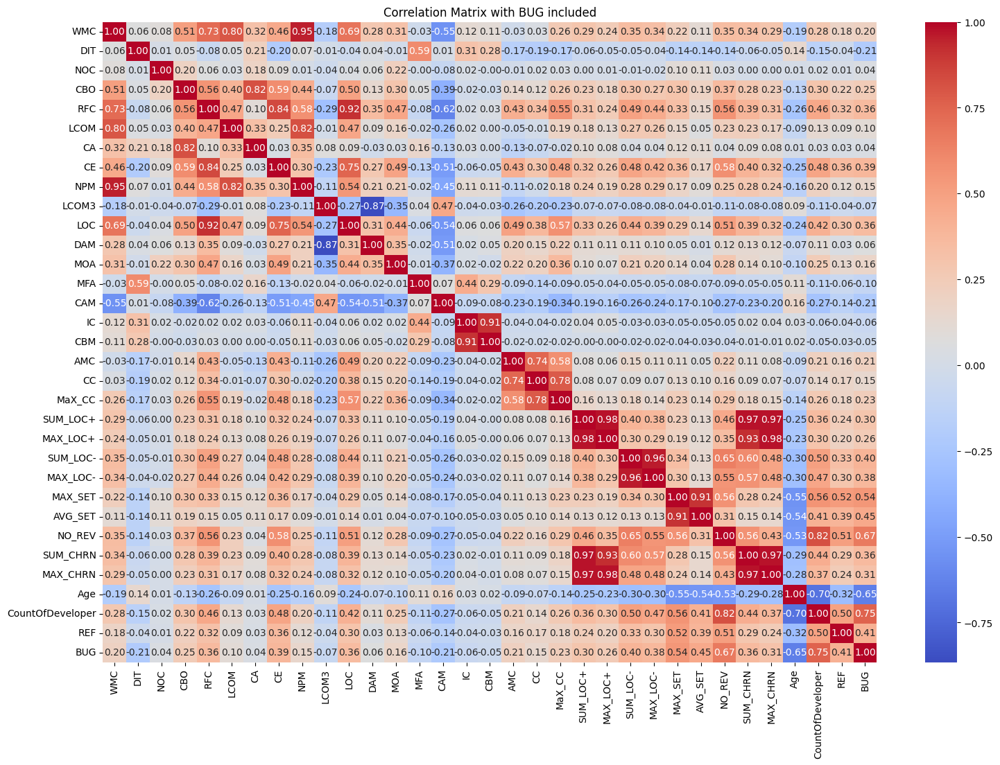

In [59]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it includes the 'BUG' column (do not change this)

# Calculate the correlation matrix including all features and the response variable 'BUG'
correlation_matrix = x_bug.corr()

# Plot the correlation matrix
plt.figure(figsize=(18,  12))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix with BUG included')
plt.show()


# Define the classifiers (you can uncomment your choicses by removing the # to add to your execution)

In [60]:

classifiers = {
    #'RandomForest': RandomForestClassifier(n_estimators=100, random_state=42),
    'LogisticRegression': LogisticRegression(max_iter=1000),
    #'SVC': SVC(probability=True, random_state=42),
    #'KNeighbors': KNeighborsClassifier(),
    #'DecisionTree': DecisionTreeClassifier(random_state=42)
}



# Iterate through the classifiers and evaluate each one (do not change this)

C:\Users\Major\miniconda3\envs\pythongForCyber\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Classifier: LogisticRegression
Confusion Matrix:
[[101   9]
 [  9  26]]


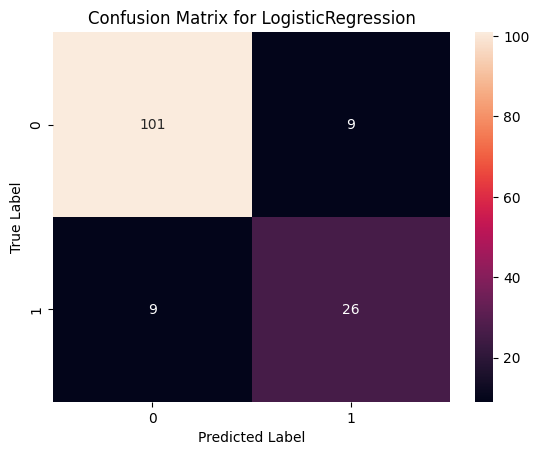

Performance Metrics for LogisticRegression:
Accuracy: 0.8759
Precision: 0.7429
Recall: 0.7429
MCC: 0.6610


In [83]:

for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    # Compute the performance metrics
    cm = confusion_matrix(y_test, y_pred)
    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    mcc = matthews_corrcoef(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)

    # Print classifier name and confusion matrix
    print(f"\nClassifier: {name}")
    print(f"Confusion Matrix:\n{cm}")

    # Plot the confusion matrix
    plot_confusion_matrix(cm, name)

    # List all performance metrics
    print(f"Performance Metrics for {name}:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"MCC: {mcc:.4f}")


# You may add codes below

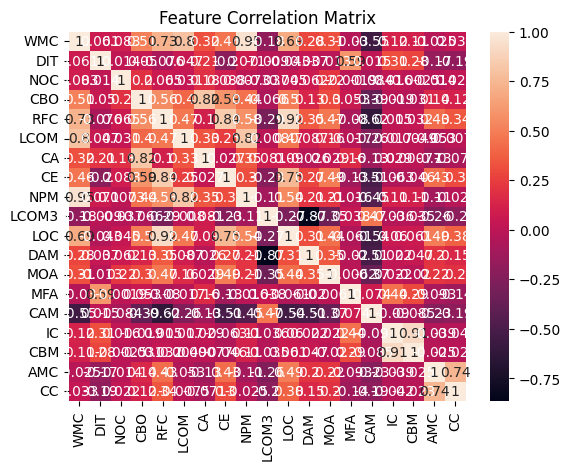

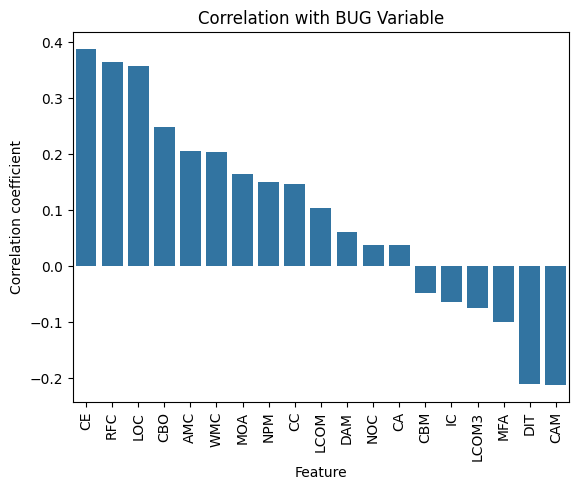

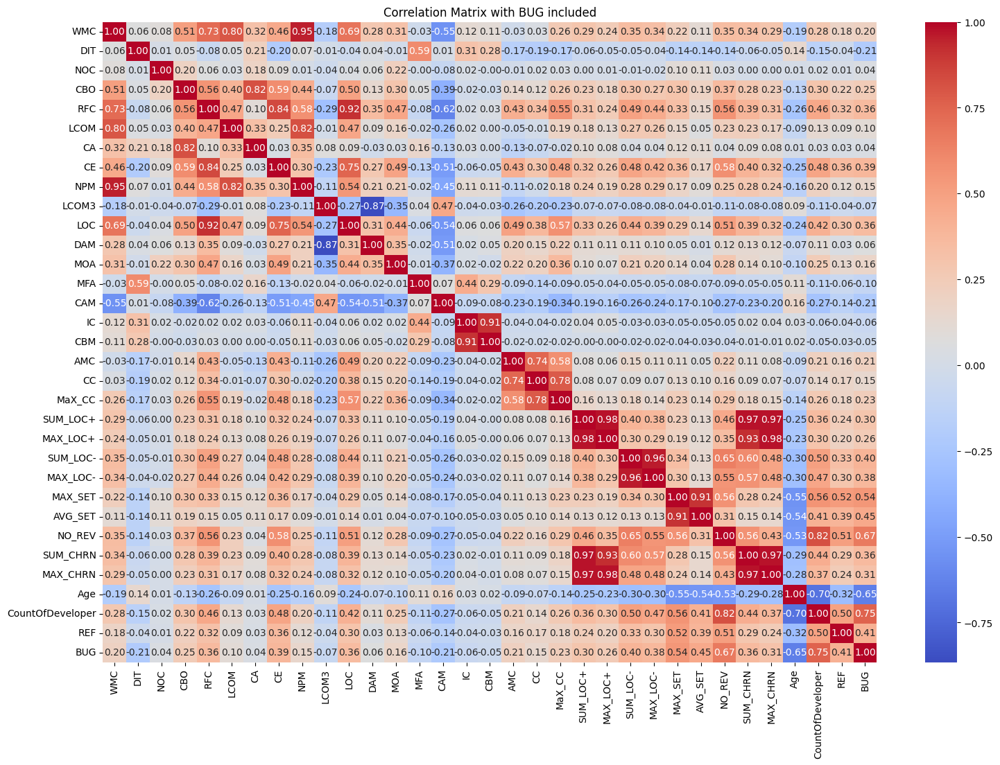


Classifier: LogisticRegression
Confusion Matrix:
[[106   4]
 [ 25  10]]


C:\Users\Major\miniconda3\envs\pythongForCyber\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


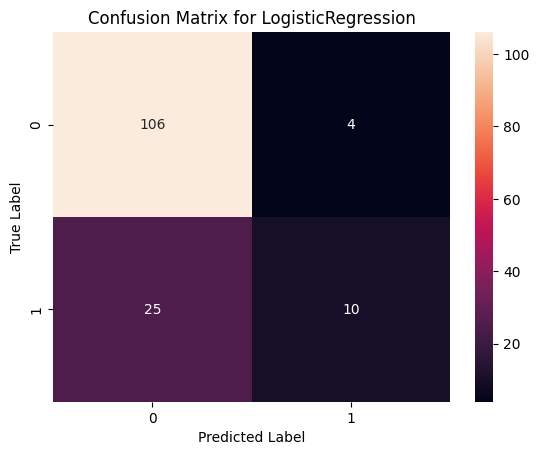

Performance Metrics for LogisticRegression:
Accuracy: 0.8000
Precision: 0.7143
Recall: 0.2857
MCC: 0.3613


In [90]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, confusion_matrix, matthews_corrcoef, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

# Read the dataset from CSV
data = pd.read_csv('Synapse.csv')

def plot_confusion_matrix(cm, classifier_name):
    sns.heatmap(cm, annot=True, fmt='d')
    plt.title(f'Confusion Matrix for {classifier_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

def plot_correlation_matrix(data):
    correlation_matrix = data.corr()
    sns.heatmap(correlation_matrix, annot=True)
    plt.title('Feature Correlation Matrix')
    plt.show()

def plot_feature_response_correlation(data, response):
    correlation_matrix = data.corr()[response].sort_values(ascending=False)
    # Drop the response variable to avoid a self-correlation of 1
    correlation_matrix = correlation_matrix.drop(response, axis=0)
    
    sns.barplot(x=correlation_matrix.index, y=correlation_matrix.values)
    plt.title(f'Correlation with {response} Variable')
    plt.xlabel('Feature')
    plt.ylabel('Correlation coefficient')
    plt.xticks(rotation=90)  # Rotate the feature names for better readability
    plt.show()

# Here we are asking to drop the featuers named "File" becuase its a text and not useful, and the label Bug because we can not have it amongs the features.
X = data.drop(['File', 'BUG'], axis=1)
# Here we are asking y to be the target variable, what we are trying to predict/ classify.
y = data['BUG']
x_bug = data.drop(['File'], axis=1)

start_idx =  X.columns.get_loc('WMC')
end_idx = X.columns.get_loc('MaX_CC')

X = X.iloc [:,start_idx:end_idx] 
end_idx
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

plot_correlation_matrix(X)

data_for_correlation = X.copy()
data_for_correlation['BUG'] = y

plot_feature_response_correlation(data_for_correlation, 'BUG')

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it includes the 'BUG' column (do not change this)

# Calculate the correlation matrix including all features and the response variable 'BUG'
correlation_matrix = x_bug.corr()

# Plot the correlation matrix
plt.figure(figsize=(18,  12))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix with BUG included')
plt.show()

classifiers = {
    #'RandomForest': RandomForestClassifier(n_estimators=100, random_state=42),
    'LogisticRegression': LogisticRegression(max_iter=1000),
    #'SVC': SVC(probability=True, random_state=42),
    #'KNeighbors': KNeighborsClassifier(),
    #'DecisionTree': DecisionTreeClassifier(random_state=42)
}

for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    # Compute the performance metrics
    cm = confusion_matrix(y_test, y_pred)
    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    mcc = matthews_corrcoef(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)

    # Print classifier name and confusion matrix
    print(f"\nClassifier: {name}")
    print(f"Confusion Matrix:\n{cm}")

    # Plot the confusion matrix
    plot_confusion_matrix(cm, name)

    # List all performance metrics
    print(f"Performance Metrics for {name}:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"MCC: {mcc:.4f}") 
    




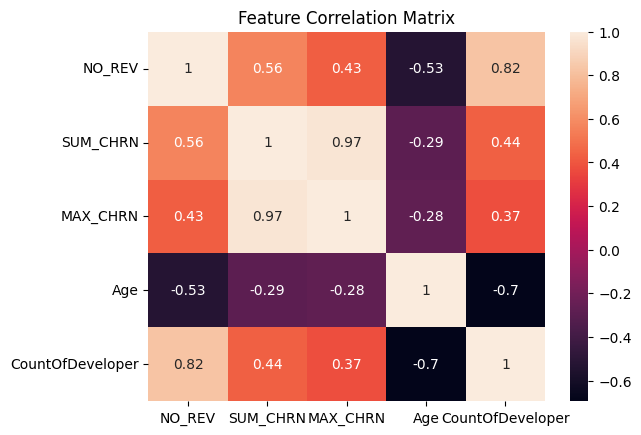

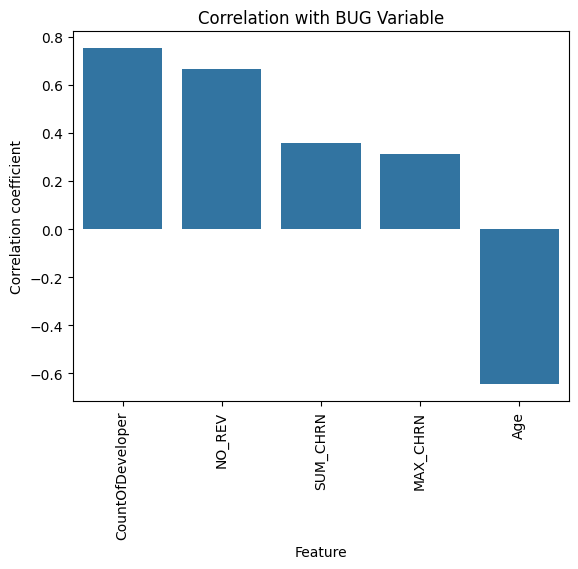

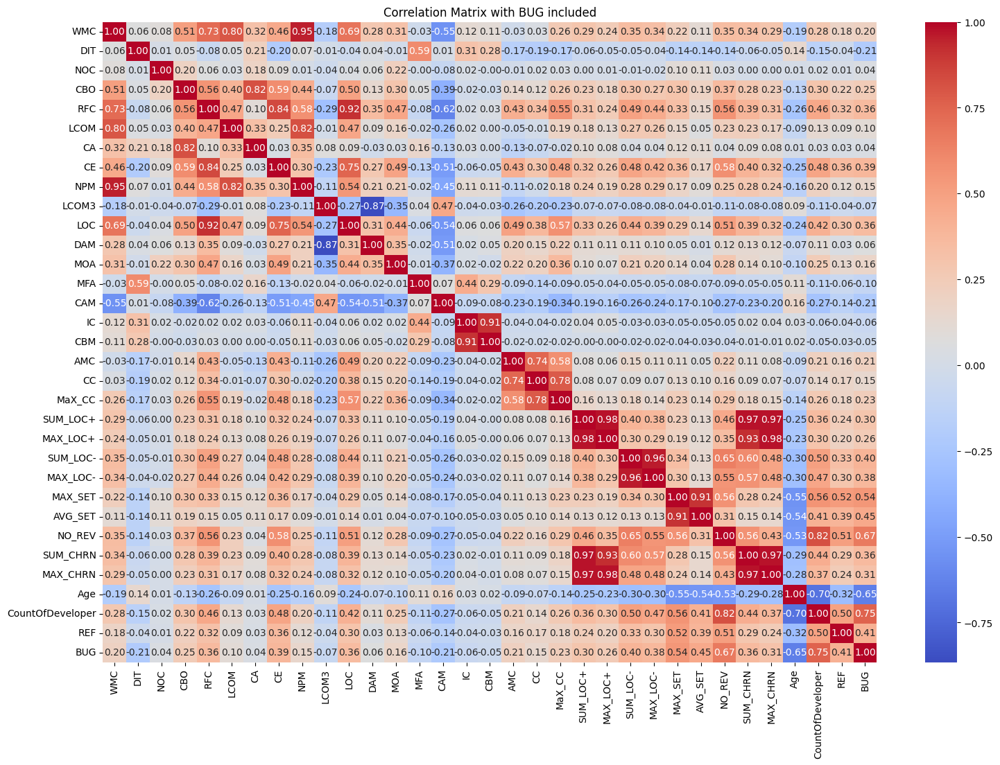


Classifier: LogisticRegression
Confusion Matrix:
[[101   9]
 [ 11  24]]


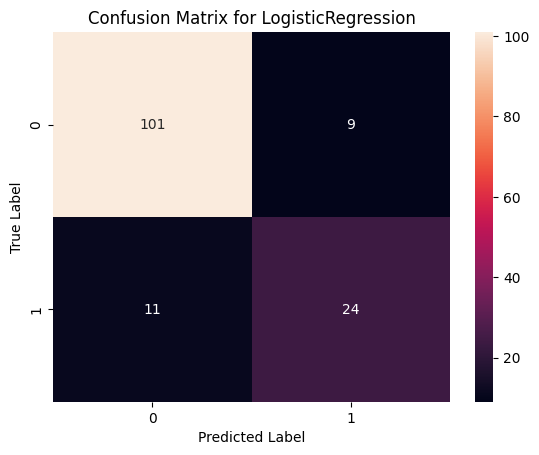

Performance Metrics for LogisticRegression:
Accuracy: 0.8621
Precision: 0.7273
Recall: 0.6857
MCC: 0.6163


In [91]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, confusion_matrix, matthews_corrcoef, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

# Read the dataset from CSV
data = pd.read_csv('Synapse.csv')

def plot_confusion_matrix(cm, classifier_name):
    sns.heatmap(cm, annot=True, fmt='d')
    plt.title(f'Confusion Matrix for {classifier_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

def plot_correlation_matrix(data):
    correlation_matrix = data.corr()
    sns.heatmap(correlation_matrix, annot=True)
    plt.title('Feature Correlation Matrix')
    plt.show()

def plot_feature_response_correlation(data, response):
    correlation_matrix = data.corr()[response].sort_values(ascending=False)
    # Drop the response variable to avoid a self-correlation of 1
    correlation_matrix = correlation_matrix.drop(response, axis=0)
    
    sns.barplot(x=correlation_matrix.index, y=correlation_matrix.values)
    plt.title(f'Correlation with {response} Variable')
    plt.xlabel('Feature')
    plt.ylabel('Correlation coefficient')
    plt.xticks(rotation=90)  # Rotate the feature names for better readability
    plt.show()

# Here we are asking to drop the featuers named "File" becuase its a text and not useful, and the label Bug because we can not have it amongs the features.
X = data.drop(['File', 'BUG'], axis=1)
# Here we are asking y to be the target variable, what we are trying to predict/ classify.
y = data['BUG']
x_bug = data.drop(['File'], axis=1)

start_idx =  X.columns.get_loc('NO_REV')
end_idx = X.columns.get_loc('REF')

X = X.iloc [:,start_idx:end_idx] 
end_idx
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

plot_correlation_matrix(X)

data_for_correlation = X.copy()
data_for_correlation['BUG'] = y

plot_feature_response_correlation(data_for_correlation, 'BUG')

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it includes the 'BUG' column (do not change this)

# Calculate the correlation matrix including all features and the response variable 'BUG'
correlation_matrix = x_bug.corr()

# Plot the correlation matrix
plt.figure(figsize=(18,  12))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix with BUG included')
plt.show()

classifiers = {
    #'RandomForest': RandomForestClassifier(n_estimators=100, random_state=42),
    'LogisticRegression': LogisticRegression(max_iter=1000),
    #'SVC': SVC(probability=True, random_state=42),
    #'KNeighbors': KNeighborsClassifier(),
    #'DecisionTree': DecisionTreeClassifier(random_state=42)
}

for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    # Compute the performance metrics
    cm = confusion_matrix(y_test, y_pred)
    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    mcc = matthews_corrcoef(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)

    # Print classifier name and confusion matrix
    print(f"\nClassifier: {name}")
    print(f"Confusion Matrix:\n{cm}")

    # Plot the confusion matrix
    plot_confusion_matrix(cm, name)

    # List all performance metrics
    print(f"Performance Metrics for {name}:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"MCC: {mcc:.4f}") 

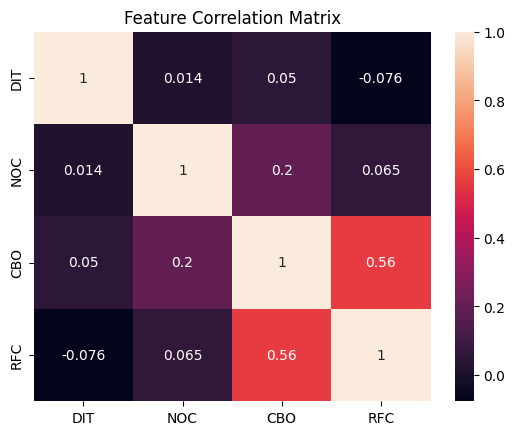

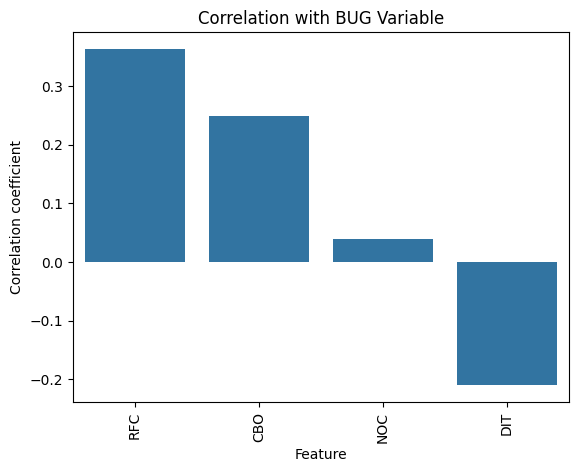

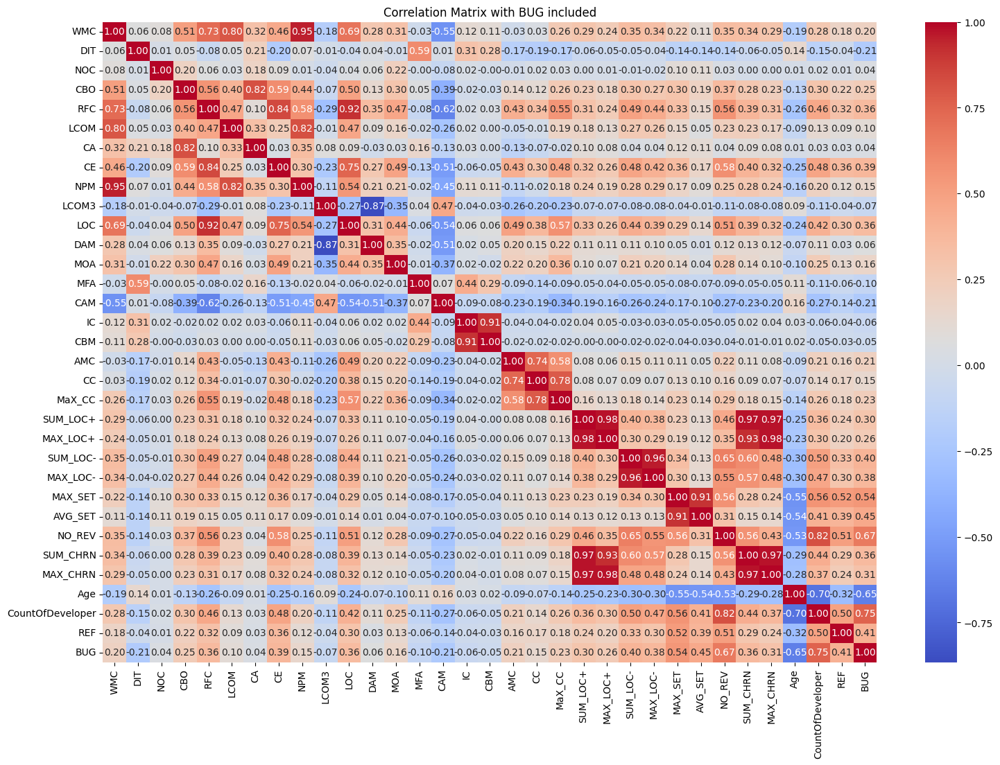


Classifier: LogisticRegression
Confusion Matrix:
[[106   4]
 [ 26   9]]


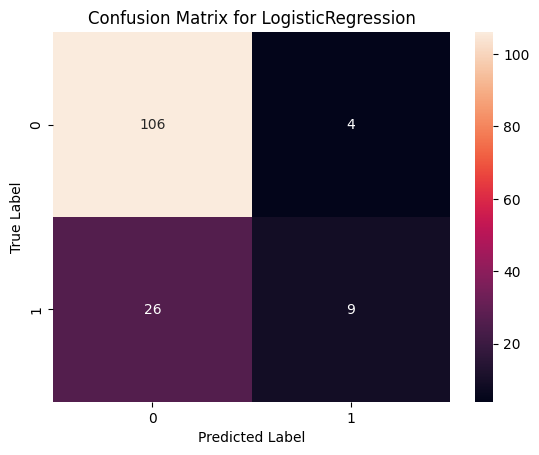

Performance Metrics for LogisticRegression:
Accuracy: 0.7931
Precision: 0.6923
Recall: 0.2571
MCC: 0.3307


In [95]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, confusion_matrix, matthews_corrcoef, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

# Read the dataset from CSV
data = pd.read_csv('Synapse.csv')

def plot_confusion_matrix(cm, classifier_name):
    sns.heatmap(cm, annot=True, fmt='d')
    plt.title(f'Confusion Matrix for {classifier_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

def plot_correlation_matrix(data):
    correlation_matrix = data.corr()
    sns.heatmap(correlation_matrix, annot=True)
    plt.title('Feature Correlation Matrix')
    plt.show()

def plot_feature_response_correlation(data, response):
    correlation_matrix = data.corr()[response].sort_values(ascending=False)
    # Drop the response variable to avoid a self-correlation of 1
    correlation_matrix = correlation_matrix.drop(response, axis=0)
    
    sns.barplot(x=correlation_matrix.index, y=correlation_matrix.values)
    plt.title(f'Correlation with {response} Variable')
    plt.xlabel('Feature')
    plt.ylabel('Correlation coefficient')
    plt.xticks(rotation=90)  # Rotate the feature names for better readability
    plt.show()

# Here we are asking to drop the featuers named "File" becuase its a text and not useful, and the label Bug because we can not have it amongs the features.
X = data.drop(['File', 'BUG'], axis=1)
# Here we are asking y to be the target variable, what we are trying to predict/ classify.
y = data['BUG']
x_bug = data.drop(['File'], axis=1)

start_idx =  X.columns.get_loc('DIT')
end_idx = X.columns.get_loc('LCOM')

X = X.iloc [:,start_idx:end_idx] 
end_idx
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

plot_correlation_matrix(X)

data_for_correlation = X.copy()
data_for_correlation['BUG'] = y

plot_feature_response_correlation(data_for_correlation, 'BUG')

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it includes the 'BUG' column (do not change this)

# Calculate the correlation matrix including all features and the response variable 'BUG'
correlation_matrix = x_bug.corr()

# Plot the correlation matrix
plt.figure(figsize=(18,  12))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix with BUG included')
plt.show()

classifiers = {
    #'RandomForest': RandomForestClassifier(n_estimators=100, random_state=42),
    'LogisticRegression': LogisticRegression(max_iter=1000),
    #'SVC': SVC(probability=True, random_state=42),
    #'KNeighbors': KNeighborsClassifier(),
    #'DecisionTree': DecisionTreeClassifier(random_state=42)
}

for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    # Compute the performance metrics
    cm = confusion_matrix(y_test, y_pred)
    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    mcc = matthews_corrcoef(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)

    # Print classifier name and confusion matrix
    print(f"\nClassifier: {name}")
    print(f"Confusion Matrix:\n{cm}")

    # Plot the confusion matrix
    plot_confusion_matrix(cm, name)

    # List all performance metrics
    print(f"Performance Metrics for {name}:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"MCC: {mcc:.4f}") 

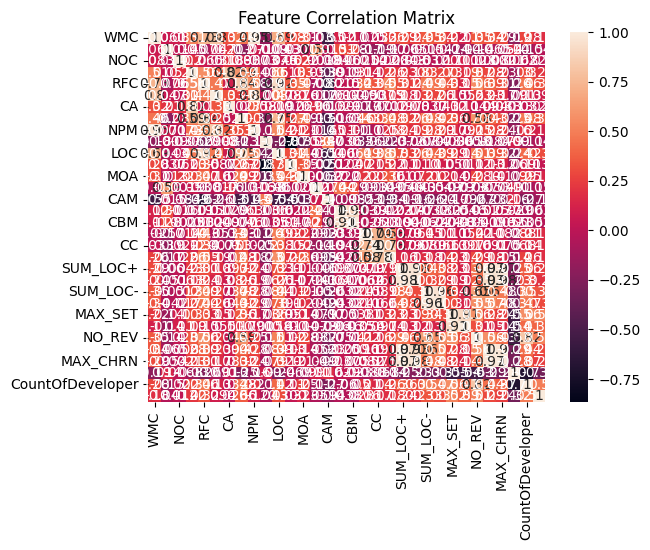

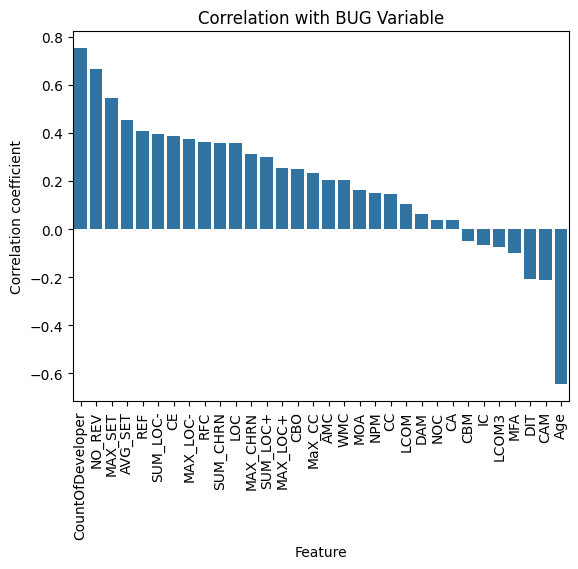

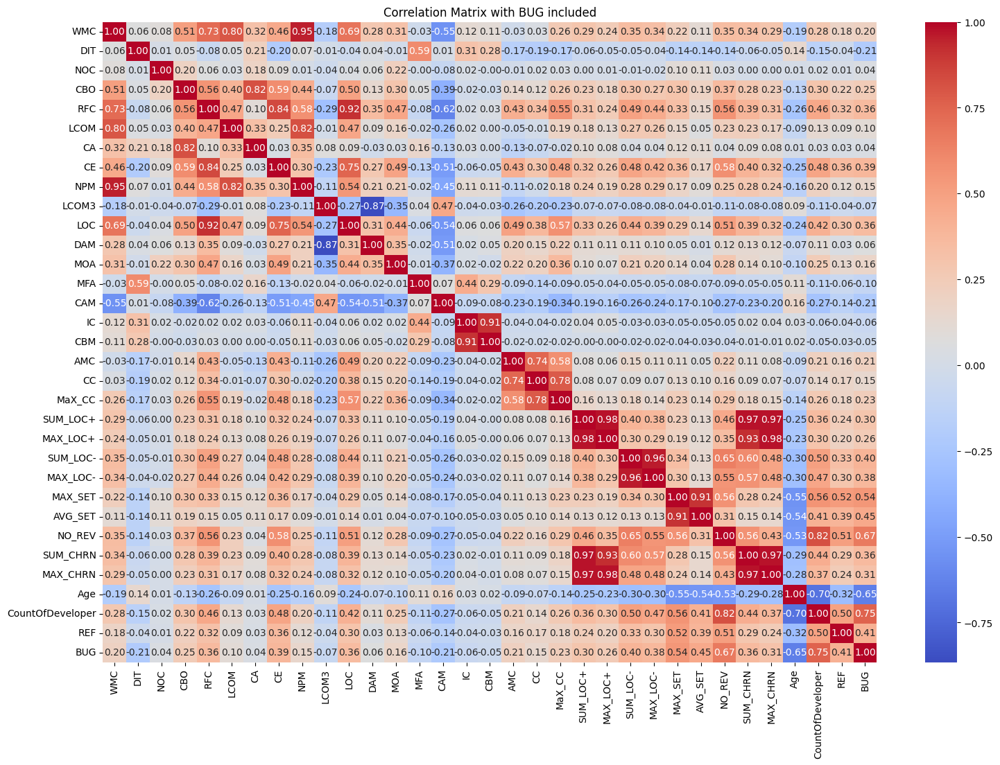


Classifier: RandomForest
Confusion Matrix:
[[104   6]
 [  3  32]]


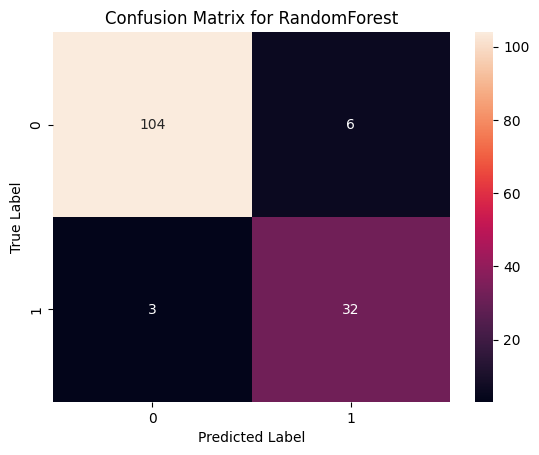

Performance Metrics for RandomForest:
Accuracy: 0.9379
Precision: 0.8421
Recall: 0.9143
MCC: 0.8366


In [96]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, confusion_matrix, matthews_corrcoef, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

# Read the dataset from CSV
data = pd.read_csv('Synapse.csv')

def plot_confusion_matrix(cm, classifier_name):
    sns.heatmap(cm, annot=True, fmt='d')
    plt.title(f'Confusion Matrix for {classifier_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

def plot_correlation_matrix(data):
    correlation_matrix = data.corr()
    sns.heatmap(correlation_matrix, annot=True)
    plt.title('Feature Correlation Matrix')
    plt.show()

def plot_feature_response_correlation(data, response):
    correlation_matrix = data.corr()[response].sort_values(ascending=False)
    # Drop the response variable to avoid a self-correlation of 1
    correlation_matrix = correlation_matrix.drop(response, axis=0)
    
    sns.barplot(x=correlation_matrix.index, y=correlation_matrix.values)
    plt.title(f'Correlation with {response} Variable')
    plt.xlabel('Feature')
    plt.ylabel('Correlation coefficient')
    plt.xticks(rotation=90)  # Rotate the feature names for better readability
    plt.show()

# Here we are asking to drop the featuers named "File" becuase its a text and not useful, and the label Bug because we can not have it amongs the features.
X = data.drop(['File', 'BUG'], axis=1)
# Here we are asking y to be the target variable, what we are trying to predict/ classify.
y = data['BUG']
x_bug = data.drop(['File'], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

plot_correlation_matrix(X)

data_for_correlation = X.copy()
data_for_correlation['BUG'] = y

plot_feature_response_correlation(data_for_correlation, 'BUG')

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it includes the 'BUG' column (do not change this)

# Calculate the correlation matrix including all features and the response variable 'BUG'
correlation_matrix = x_bug.corr()

# Plot the correlation matrix
plt.figure(figsize=(18,  12))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix with BUG included')
plt.show()

classifiers = {
    'RandomForest': RandomForestClassifier(n_estimators=100, random_state=42),
    #'LogisticRegression': LogisticRegression(max_iter=1000),
    #'SVC': SVC(probability=True, random_state=42),
    #'KNeighbors': KNeighborsClassifier(),
    #'DecisionTree': DecisionTreeClassifier(random_state=42)
}

for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    # Compute the performance metrics
    cm = confusion_matrix(y_test, y_pred)
    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    mcc = matthews_corrcoef(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)

    # Print classifier name and confusion matrix
    print(f"\nClassifier: {name}")
    print(f"Confusion Matrix:\n{cm}")

    # Plot the confusion matrix
    plot_confusion_matrix(cm, name)

    # List all performance metrics
    print(f"Performance Metrics for {name}:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"MCC: {mcc:.4f}") 

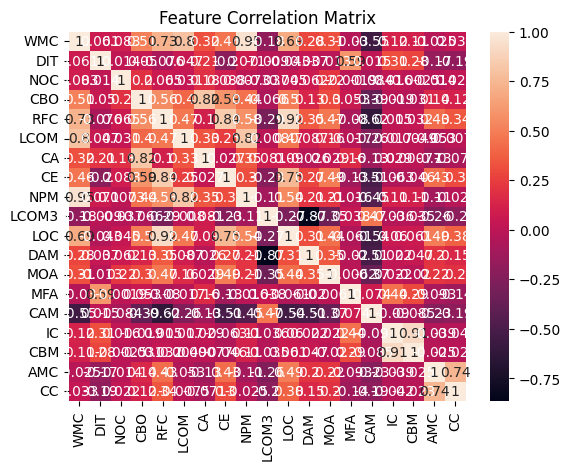

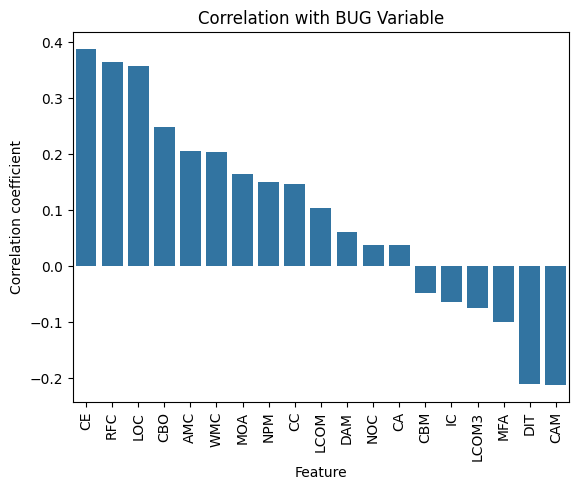

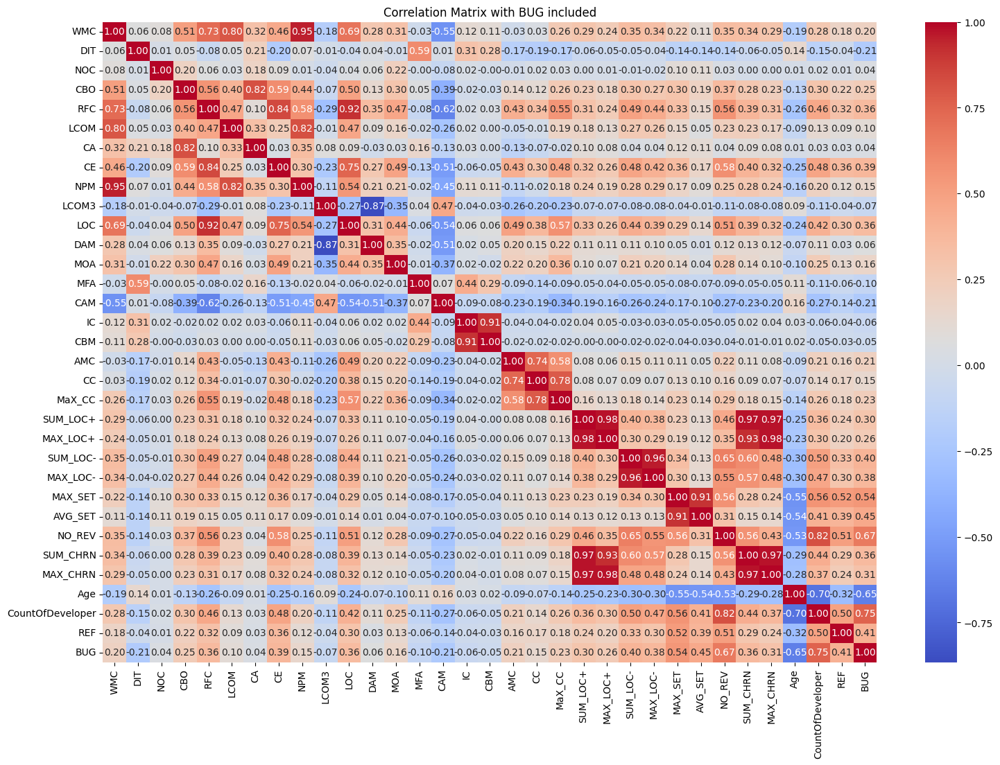


Classifier: RandomForest
Confusion Matrix:
[[97 13]
 [22 13]]


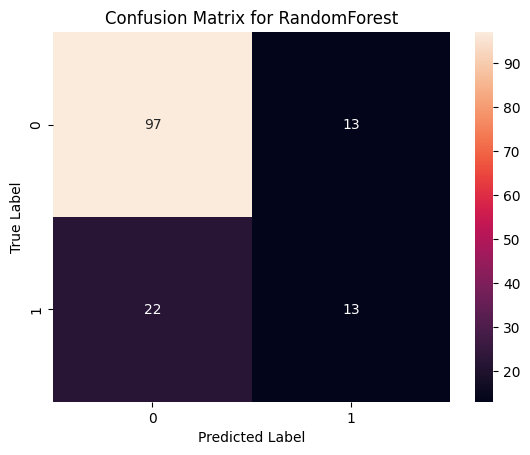

Performance Metrics for RandomForest:
Accuracy: 0.7586
Precision: 0.5000
Recall: 0.3714
MCC: 0.2825


In [97]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, confusion_matrix, matthews_corrcoef, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

# Read the dataset from CSV
data = pd.read_csv('Synapse.csv')

def plot_confusion_matrix(cm, classifier_name):
    sns.heatmap(cm, annot=True, fmt='d')
    plt.title(f'Confusion Matrix for {classifier_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

def plot_correlation_matrix(data):
    correlation_matrix = data.corr()
    sns.heatmap(correlation_matrix, annot=True)
    plt.title('Feature Correlation Matrix')
    plt.show()

def plot_feature_response_correlation(data, response):
    correlation_matrix = data.corr()[response].sort_values(ascending=False)
    # Drop the response variable to avoid a self-correlation of 1
    correlation_matrix = correlation_matrix.drop(response, axis=0)
    
    sns.barplot(x=correlation_matrix.index, y=correlation_matrix.values)
    plt.title(f'Correlation with {response} Variable')
    plt.xlabel('Feature')
    plt.ylabel('Correlation coefficient')
    plt.xticks(rotation=90)  # Rotate the feature names for better readability
    plt.show()

# Here we are asking to drop the featuers named "File" becuase its a text and not useful, and the label Bug because we can not have it amongs the features.
X = data.drop(['File', 'BUG'], axis=1)
# Here we are asking y to be the target variable, what we are trying to predict/ classify.
y = data['BUG']
x_bug = data.drop(['File'], axis=1)

start_idx =  X.columns.get_loc('WMC')
end_idx = X.columns.get_loc('MaX_CC')

X = X.iloc [:,start_idx:end_idx] 
end_idx
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

plot_correlation_matrix(X)

data_for_correlation = X.copy()
data_for_correlation['BUG'] = y

plot_feature_response_correlation(data_for_correlation, 'BUG')

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it includes the 'BUG' column (do not change this)

# Calculate the correlation matrix including all features and the response variable 'BUG'
correlation_matrix = x_bug.corr()

# Plot the correlation matrix
plt.figure(figsize=(18,  12))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix with BUG included')
plt.show()

classifiers = {
    'RandomForest': RandomForestClassifier(n_estimators=100, random_state=42),
    #'LogisticRegression': LogisticRegression(max_iter=1000),
    #'SVC': SVC(probability=True, random_state=42),
    #'KNeighbors': KNeighborsClassifier(),
    #'DecisionTree': DecisionTreeClassifier(random_state=42)
}

for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    # Compute the performance metrics
    cm = confusion_matrix(y_test, y_pred)
    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    mcc = matthews_corrcoef(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)

    # Print classifier name and confusion matrix
    print(f"\nClassifier: {name}")
    print(f"Confusion Matrix:\n{cm}")

    # Plot the confusion matrix
    plot_confusion_matrix(cm, name)

    # List all performance metrics
    print(f"Performance Metrics for {name}:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"MCC: {mcc:.4f}") 

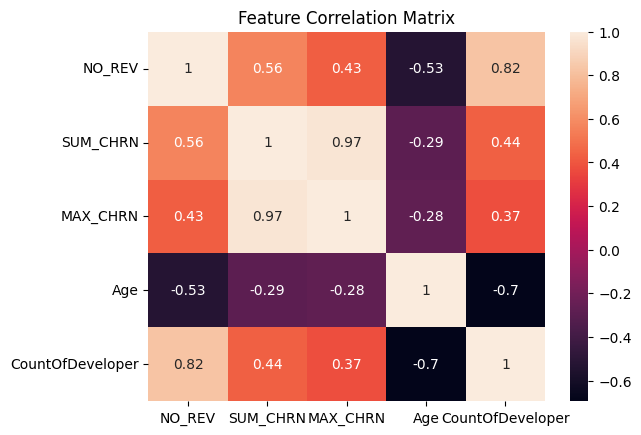

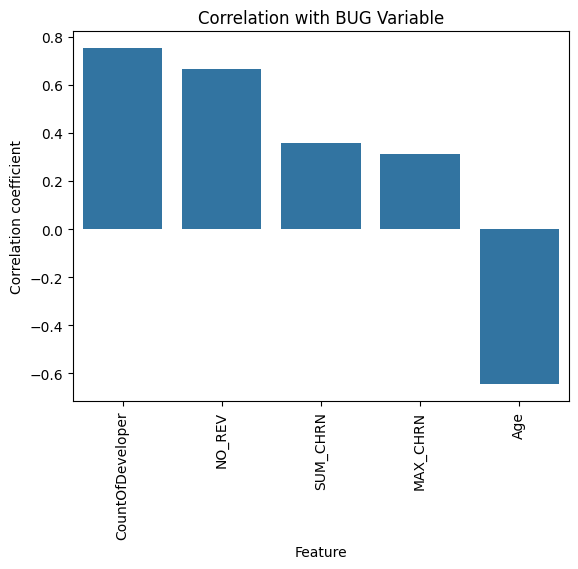

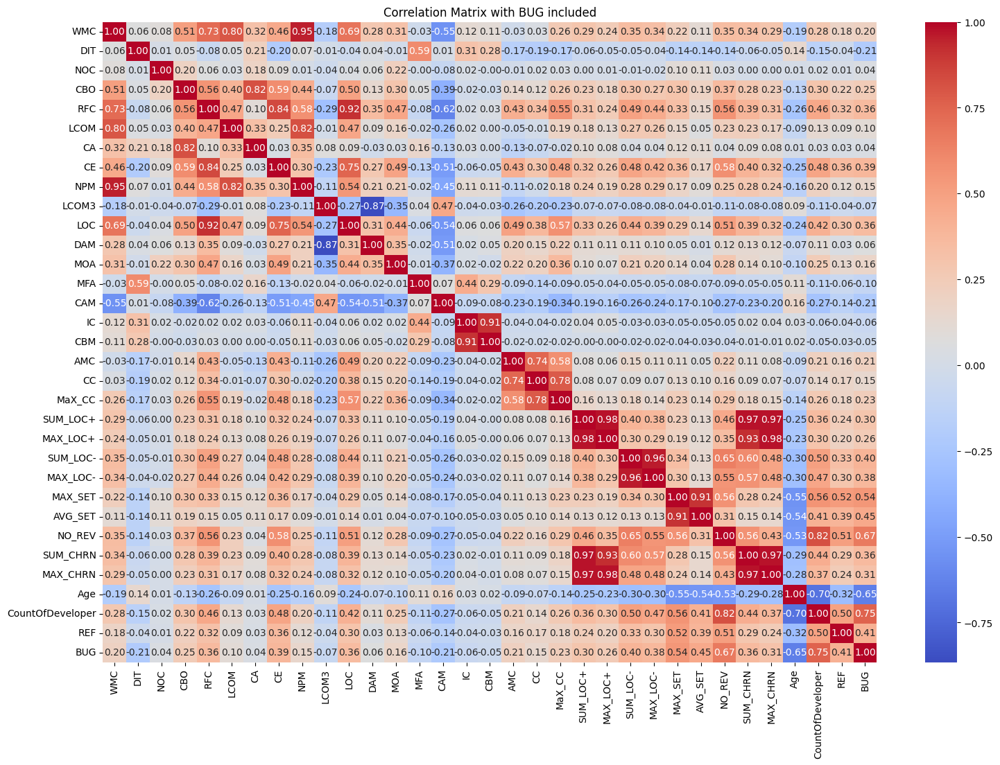


Classifier: RandomForest
Confusion Matrix:
[[106   4]
 [  5  30]]


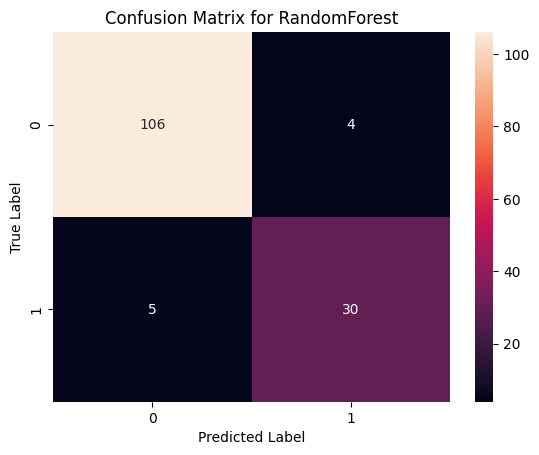

Performance Metrics for RandomForest:
Accuracy: 0.9379
Precision: 0.8824
Recall: 0.8571
MCC: 0.8290


In [98]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, confusion_matrix, matthews_corrcoef, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

# Read the dataset from CSV
data = pd.read_csv('Synapse.csv')

def plot_confusion_matrix(cm, classifier_name):
    sns.heatmap(cm, annot=True, fmt='d')
    plt.title(f'Confusion Matrix for {classifier_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

def plot_correlation_matrix(data):
    correlation_matrix = data.corr()
    sns.heatmap(correlation_matrix, annot=True)
    plt.title('Feature Correlation Matrix')
    plt.show()

def plot_feature_response_correlation(data, response):
    correlation_matrix = data.corr()[response].sort_values(ascending=False)
    # Drop the response variable to avoid a self-correlation of 1
    correlation_matrix = correlation_matrix.drop(response, axis=0)
    
    sns.barplot(x=correlation_matrix.index, y=correlation_matrix.values)
    plt.title(f'Correlation with {response} Variable')
    plt.xlabel('Feature')
    plt.ylabel('Correlation coefficient')
    plt.xticks(rotation=90)  # Rotate the feature names for better readability
    plt.show()

# Here we are asking to drop the featuers named "File" becuase its a text and not useful, and the label Bug because we can not have it amongs the features.
X = data.drop(['File', 'BUG'], axis=1)
# Here we are asking y to be the target variable, what we are trying to predict/ classify.
y = data['BUG']
x_bug = data.drop(['File'], axis=1)

start_idx =  X.columns.get_loc('NO_REV')
end_idx = X.columns.get_loc('REF')

X = X.iloc [:,start_idx:end_idx] 
end_idx
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

plot_correlation_matrix(X)

data_for_correlation = X.copy()
data_for_correlation['BUG'] = y

plot_feature_response_correlation(data_for_correlation, 'BUG')

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it includes the 'BUG' column (do not change this)

# Calculate the correlation matrix including all features and the response variable 'BUG'
correlation_matrix = x_bug.corr()

# Plot the correlation matrix
plt.figure(figsize=(18,  12))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix with BUG included')
plt.show()

classifiers = {
    'RandomForest': RandomForestClassifier(n_estimators=100, random_state=42),
    #'LogisticRegression': LogisticRegression(max_iter=1000),
    #'SVC': SVC(probability=True, random_state=42),
    #'KNeighbors': KNeighborsClassifier(),
    #'DecisionTree': DecisionTreeClassifier(random_state=42)
}

for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    # Compute the performance metrics
    cm = confusion_matrix(y_test, y_pred)
    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    mcc = matthews_corrcoef(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)

    # Print classifier name and confusion matrix
    print(f"\nClassifier: {name}")
    print(f"Confusion Matrix:\n{cm}")

    # Plot the confusion matrix
    plot_confusion_matrix(cm, name)

    # List all performance metrics
    print(f"Performance Metrics for {name}:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"MCC: {mcc:.4f}") 

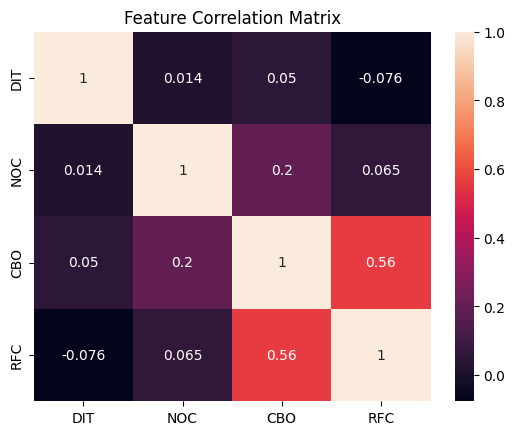

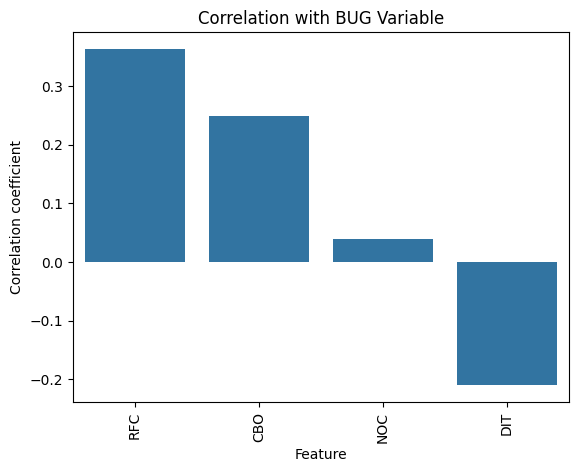

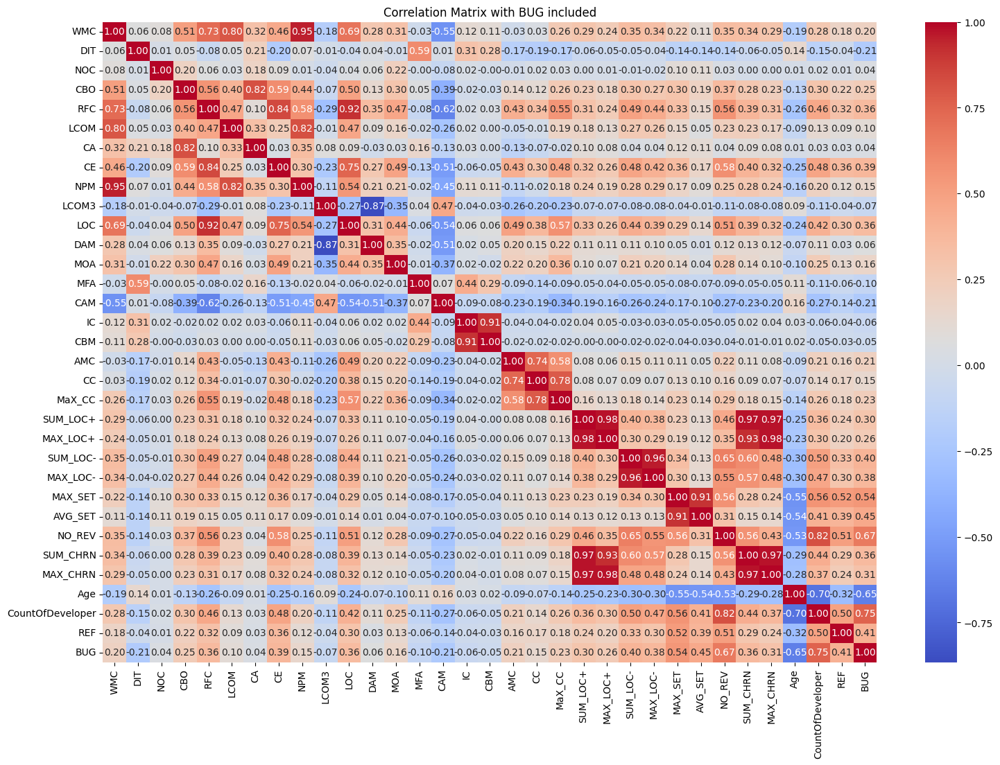


Classifier: RandomForest
Confusion Matrix:
[[94 16]
 [23 12]]


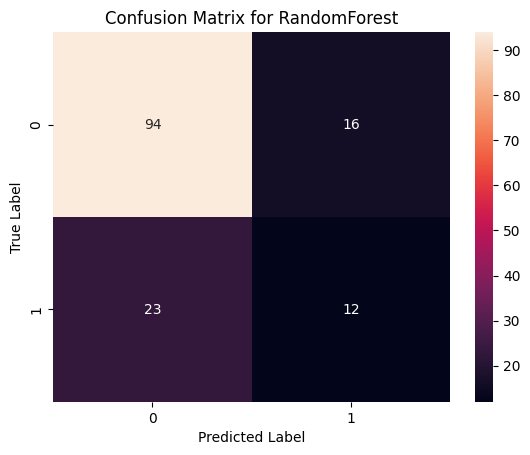

Performance Metrics for RandomForest:
Accuracy: 0.7310
Precision: 0.4286
Recall: 0.3429
MCC: 0.2140


In [99]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, confusion_matrix, matthews_corrcoef, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

# Read the dataset from CSV
data = pd.read_csv('Synapse.csv')

def plot_confusion_matrix(cm, classifier_name):
    sns.heatmap(cm, annot=True, fmt='d')
    plt.title(f'Confusion Matrix for {classifier_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

def plot_correlation_matrix(data):
    correlation_matrix = data.corr()
    sns.heatmap(correlation_matrix, annot=True)
    plt.title('Feature Correlation Matrix')
    plt.show()

def plot_feature_response_correlation(data, response):
    correlation_matrix = data.corr()[response].sort_values(ascending=False)
    # Drop the response variable to avoid a self-correlation of 1
    correlation_matrix = correlation_matrix.drop(response, axis=0)
    
    sns.barplot(x=correlation_matrix.index, y=correlation_matrix.values)
    plt.title(f'Correlation with {response} Variable')
    plt.xlabel('Feature')
    plt.ylabel('Correlation coefficient')
    plt.xticks(rotation=90)  # Rotate the feature names for better readability
    plt.show()

# Here we are asking to drop the featuers named "File" becuase its a text and not useful, and the label Bug because we can not have it amongs the features.
X = data.drop(['File', 'BUG'], axis=1)
# Here we are asking y to be the target variable, what we are trying to predict/ classify.
y = data['BUG']
x_bug = data.drop(['File'], axis=1)

start_idx =  X.columns.get_loc('DIT')
end_idx = X.columns.get_loc('LCOM')

X = X.iloc [:,start_idx:end_idx] 
end_idx
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

plot_correlation_matrix(X)

data_for_correlation = X.copy()
data_for_correlation['BUG'] = y

plot_feature_response_correlation(data_for_correlation, 'BUG')

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it includes the 'BUG' column (do not change this)

# Calculate the correlation matrix including all features and the response variable 'BUG'
correlation_matrix = x_bug.corr()

# Plot the correlation matrix
plt.figure(figsize=(18,  12))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix with BUG included')
plt.show()

classifiers = {
    'RandomForest': RandomForestClassifier(n_estimators=100, random_state=42),
    #'LogisticRegression': LogisticRegression(max_iter=1000),
    #'SVC': SVC(probability=True, random_state=42),
    #'KNeighbors': KNeighborsClassifier(),
    #'DecisionTree': DecisionTreeClassifier(random_state=42)
}

for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    # Compute the performance metrics
    cm = confusion_matrix(y_test, y_pred)
    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    mcc = matthews_corrcoef(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)

    # Print classifier name and confusion matrix
    print(f"\nClassifier: {name}")
    print(f"Confusion Matrix:\n{cm}")

    # Plot the confusion matrix
    plot_confusion_matrix(cm, name)

    # List all performance metrics
    print(f"Performance Metrics for {name}:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"MCC: {mcc:.4f}") 

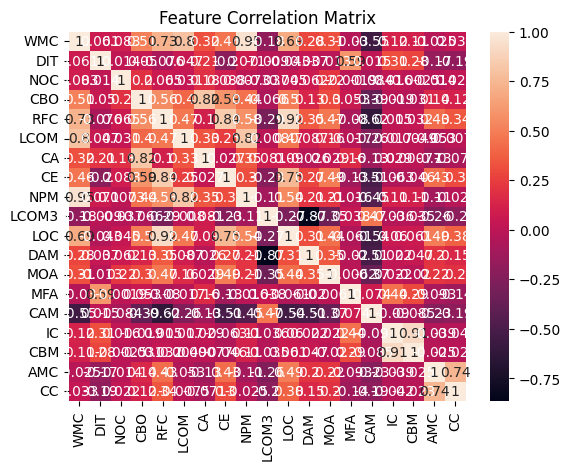

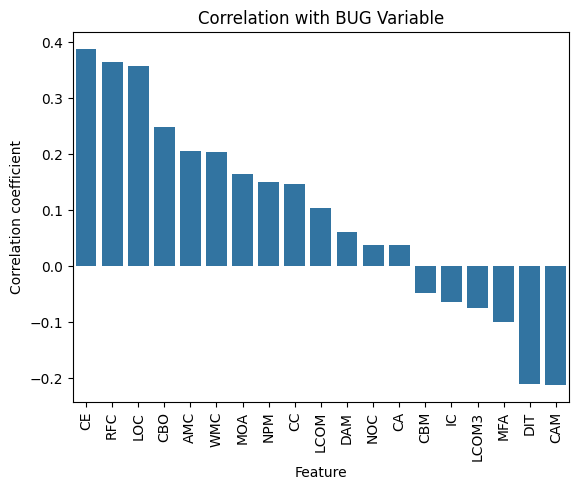

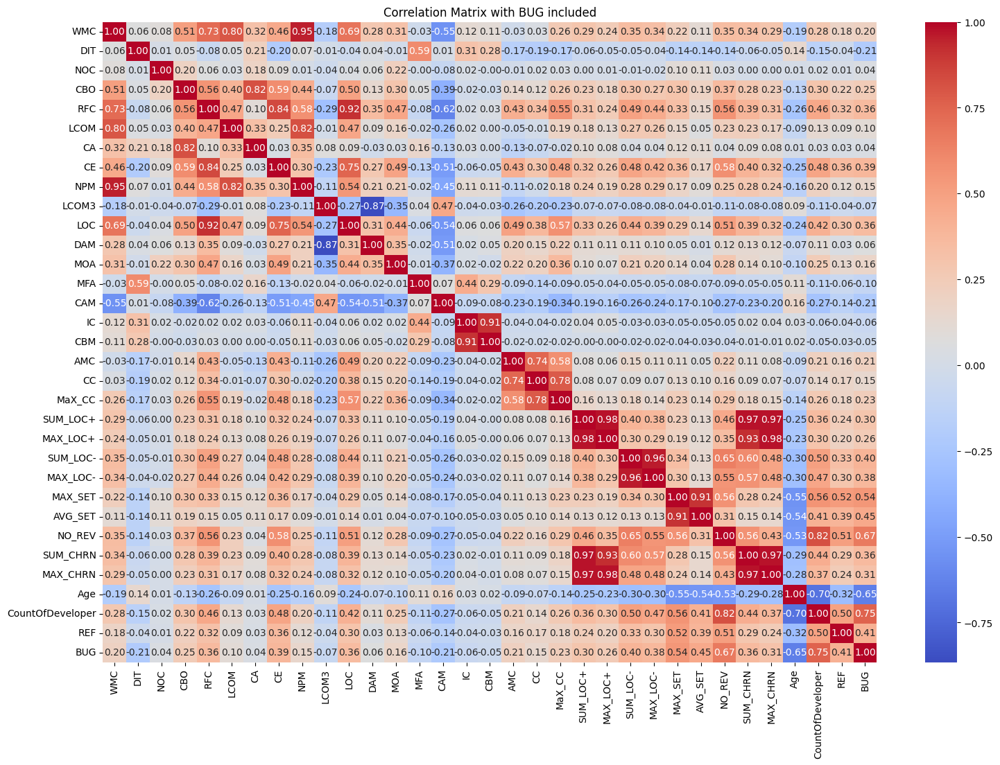


Classifier: SVC
Confusion Matrix:
[[103   7]
 [ 26   9]]


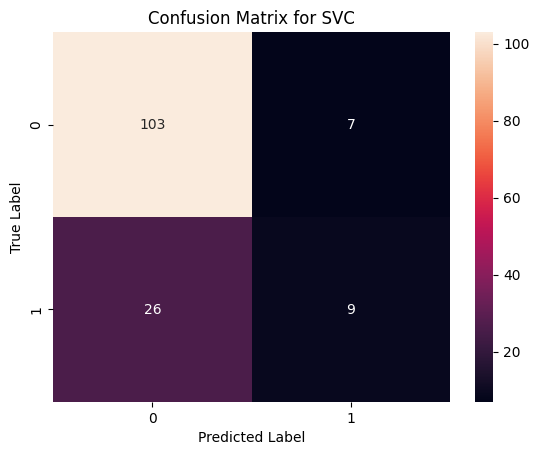

Performance Metrics for SVC:
Accuracy: 0.7724
Precision: 0.5625
Recall: 0.2571
MCC: 0.2643


In [100]:
#Question 4 on Homework 2

import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, confusion_matrix, matthews_corrcoef, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

# Read the dataset from CSV
data = pd.read_csv('Synapse.csv')

def plot_confusion_matrix(cm, classifier_name):
    sns.heatmap(cm, annot=True, fmt='d')
    plt.title(f'Confusion Matrix for {classifier_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

def plot_correlation_matrix(data):
    correlation_matrix = data.corr()
    sns.heatmap(correlation_matrix, annot=True)
    plt.title('Feature Correlation Matrix')
    plt.show()

def plot_feature_response_correlation(data, response):
    correlation_matrix = data.corr()[response].sort_values(ascending=False)
    # Drop the response variable to avoid a self-correlation of 1
    correlation_matrix = correlation_matrix.drop(response, axis=0)
    
    sns.barplot(x=correlation_matrix.index, y=correlation_matrix.values)
    plt.title(f'Correlation with {response} Variable')
    plt.xlabel('Feature')
    plt.ylabel('Correlation coefficient')
    plt.xticks(rotation=90)  # Rotate the feature names for better readability
    plt.show()

# Here we are asking to drop the featuers named "File" becuase its a text and not useful, and the label Bug because we can not have it amongs the features.
X = data.drop(['File', 'BUG'], axis=1)
# Here we are asking y to be the target variable, what we are trying to predict/ classify.
y = data['BUG']
x_bug = data.drop(['File'], axis=1)

start_idx =  X.columns.get_loc('WMC')
end_idx = X.columns.get_loc('MaX_CC')

X = X.iloc [:,start_idx:end_idx] 
end_idx
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

plot_correlation_matrix(X)

data_for_correlation = X.copy()
data_for_correlation['BUG'] = y

plot_feature_response_correlation(data_for_correlation, 'BUG')

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it includes the 'BUG' column (do not change this)

# Calculate the correlation matrix including all features and the response variable 'BUG'
correlation_matrix = x_bug.corr()

# Plot the correlation matrix
plt.figure(figsize=(18,  12))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix with BUG included')
plt.show()

classifiers = {
    #'RandomForest': RandomForestClassifier(n_estimators=100, random_state=42),
    #'LogisticRegression': LogisticRegression(max_iter=1000),
    'SVC': SVC(probability=True, random_state=42),
    #'KNeighbors': KNeighborsClassifier(),
    #'DecisionTree': DecisionTreeClassifier(random_state=42)
}

for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    # Compute the performance metrics
    cm = confusion_matrix(y_test, y_pred)
    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    mcc = matthews_corrcoef(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)

    # Print classifier name and confusion matrix
    print(f"\nClassifier: {name}")
    print(f"Confusion Matrix:\n{cm}")

    # Plot the confusion matrix
    plot_confusion_matrix(cm, name)

    # List all performance metrics
    print(f"Performance Metrics for {name}:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"MCC: {mcc:.4f}") 
    


Answer for Question 2 on HW2 

For this chart I used a scatter plot to show the correlation between CA and NOC.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
data = pd.read_csv('Synapse.csv')
plt.figure(figsize=(12,4), dpi=200)
sns.scatterplot(x='NOC', y='CA', data=data)



In [ ]:
For this chart I created a table chart to display the summary statistics of the Synapse csv file

In [110]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv('Synapse.csv')
summary_stats = df.describe()
summary_stats

,WMC,DIT,NOC,CBO,RFC,LCOM,CA,CE,NPM,LCOM3,...,MAX_LOC+,SUM_LOC-,MAX_LOC-,MAX_SET,AVG_SET,NO_REV,SUM_CHRN,MAX_CHRN,Age,CountOfDeveloper
count,723.000000,723.000000,723.000000,723.000000,723.000000,723.000000,723.000000,723.00000,723.000000,723.000000,...,723.000000,723.000000,723.000000,723.000000,723.000000,723.000000,723.000000,723.000000,723.000000,723.000000
mean,8.193638,0.699862,0.333333,12.901798,30.414938,43.373444,4.421853,8.75657,6.236515,1.055296,...,12.958506,4.827109,3.706777,10.822960,7.801176,0.789765,20.283541,16.297372,96.707607,0.486860
std,9.766732,0.613638,2.487271,14.672134,31.253621,201.221103,12.120833,8.66786,8.659659,0.661150,...,50.489443,15.905338,12.486771,22.596403,17.670616,1.501635,64.057830,54.652656,90.477210,0.739305
min,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-79.000000,0.000000
25%,3.000000,0.000000,0.000000,6.000000,10.500000,1.000000,1.000000,3.00000,2.000000,0.600000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,26.140000,0.000000
50%,5.000000,1.000000,0.000000,10.000000,23.000000,3.000000,2.000000,7.00000,3.000000,0.833333,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,106.280000,0.000000
75%,9.000000,1.000000,0.000000,14.500000,39.000000,15.000000,4.000000,11.00000,7.000000,2.000000,...,4.000000,2.000000,2.000000,7.000000,5.810000,1.000000,8.000000,6.500000,172.070000,1.000000
max,95.000000,4.000000,38.000000,161.000000,231.000000,2527.000000,155.000000,70.00000,91.000000,2.000000,...,811.000000,148.000000,122.000000,96.000000,96.000000,13.000000,814.000000,811.000000,224.710000,4.000000


Answer for Question 2:A

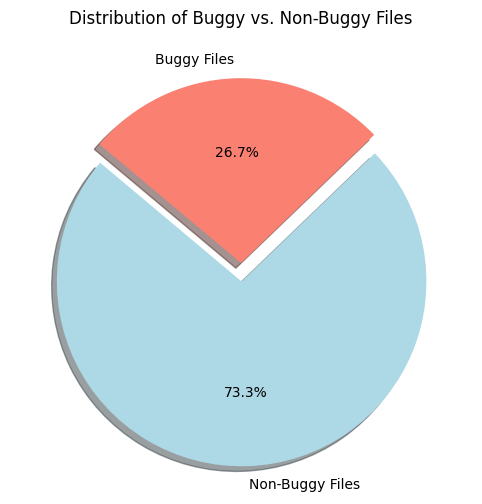

In [5]:
import pandas as pd
data = pd.read_csv('Synapse.csv')
import matplotlib.pyplot as plt 
buggy_counts = data['BUG'].value_counts()

# Labels and sizes for the pie chart
labels = ['Non-Buggy Files', 'Buggy Files']
sizes = [buggy_counts[False], buggy_counts[True]]
colors = ['lightblue', 'salmon']
explode = (0.1, 0)  # Slightly "explode" the non-buggy section

# Plotting the pie chart
plt.figure(figsize=(8, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors, explode=explode, shadow=True)
plt.title('Distribution of Buggy vs. Non-Buggy Files')
plt.show()